In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
import missingno as msno
import matplotlib.pyplot as plt


Load the CSV file into a pandas DataFrame

In [ ]:
#car_analysis(in).csv
file_path= "/content/drive/MyDrive/car_analysis(in)1.csv - car_analysis(in).csv"
df = pd.read_csv(file_path)


In [ ]:
print(df.head())

            Make                            Model    Price  Year  Kilometer  \
0          Honda              Amaze 1.2 VX i-VTEC   505000  2017      87150   
1  Maruti Suzuki                  Swift DZire VDI   450000  2014      75000   
2        Hyundai             i10 Magna 1.2 Kappa2   220000  2011      67000   
3         Toyota                         Glanza G   799000  2019      37500   
4         Toyota  Innova 2.4 VX 7 STR [2016-2020]  1950000  2018      69000   

  Fuel_Type Transmission   Location   Color   Owner  Seller_ype   Engine  \
0    Petrol       Manual       Pune    Grey   First   Corporate  1198 cc   
1    Diesel       Manual   Ludhiana   White  Second  Individual  1248 cc   
2    Petrol       Manual    Lucknow  Maroon   First  Individual  1197 cc   
3    Petrol       Manual  Mangalore     Red   First  Individual  1197 cc   
4    Diesel       Manual     Mumbai    Grey   First  Individual  2393 cc   

            Max_Power              Max_Torque Drivetrain  Length   W

**2.​ Basic Information & Initial Inspection:**

In [ ]:
total_cols = len(df.nunique())
total_rows = len(df)
print(total_cols)
print(total_rows)

20
2059


In [ ]:
column_names = df.columns.tolist()
print(column_names)

['Make', 'Model', 'Price', 'Year', 'Kilometer', 'Fuel_Type', 'Transmission', 'Location', 'Color', 'Owner', 'Seller_ype', 'Engine', 'Max_Power', 'Max_Torque', 'Drivetrain', 'Length', 'Width', 'Height', 'Seating_Capacity', 'Fuel_Tank_Capacity']


In [ ]:
file_size_bytes = os.path.getsize(file_path)
file_size_mb = file_size_bytes / (1024 * 1024)
print(f"The CSV file size on disk is: {file_size_mb:.2f} MB")

The CSV file size on disk is: 0.32 MB


In [ ]:
def unique_values():
  unique_counts = df.nunique()
  for col in df.columns:
    count = unique_counts[col]
    print(f"{col}: {count}")
    if count == total_rows:
        print("Identifier Column")
    elif count == 1:
        print("Constant Column")
    elif count < 10:
        print("Categorical-Low cardinality")
    elif count < 50:
        print("Categorical-Medium cardinality")
    else:
        print("High Cardinality")
    print("\n")



print(unique_values())

Make: 33
Categorical-Medium cardinality


Model: 1050
High Cardinality


Price: 619
High Cardinality


Year: 22
Categorical-Medium cardinality


Kilometer: 847
High Cardinality


Fuel_Type: 9
Categorical-Low cardinality


Transmission: 2
Categorical-Low cardinality


Location: 77
High Cardinality


Color: 17
Categorical-Medium cardinality


Owner: 6
Categorical-Low cardinality


Seller_ype: 3
Categorical-Low cardinality


Engine: 108
High Cardinality


Max_Power: 335
High Cardinality


Max_Torque: 290
High Cardinality


Drivetrain: 3
Categorical-Low cardinality


Length: 248
High Cardinality


Width: 170
High Cardinality


Height: 196
High Cardinality


Seating_Capacity: 6
Categorical-Low cardinality


Fuel_Tank_Capacity: 55
High Cardinality


None


**3.​ Data Cleaning (Often Iterative with Exploration):**

In [ ]:
#missing values
print(df.isnull().sum())

Make                    0
Model                   0
Price                   0
Year                    0
Kilometer               0
Fuel_Type               0
Transmission            0
Location                0
Color                   0
Owner                   0
Seller_ype              0
Engine                 80
Max_Power              80
Max_Torque             80
Drivetrain            136
Length                 64
Width                  64
Height                 64
Seating_Capacity       64
Fuel_Tank_Capacity    113
dtype: int64


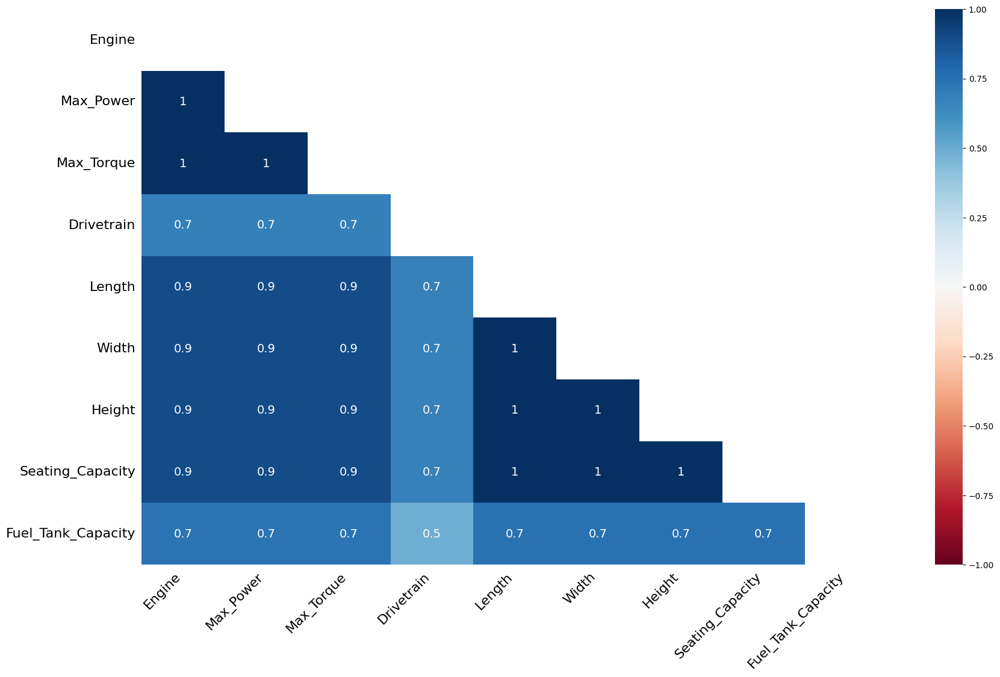

In [ ]:

# Heatmap to detect correlation of missingness between columns
msno.heatmap(df)
plt.show()

In [ ]:
print(df.columns.tolist())

['Make', 'Model', 'Price', 'Year', 'Kilometer', 'Fuel_Type', 'Transmission', 'Location', 'Color', 'Owner', 'Seller_ype', 'Engine', 'Max_Power', 'Max_Torque', 'Drivetrain', 'Length', 'Width', 'Height', 'Seating_Capacity', 'Fuel_Tank_Capacity']


In [ ]:
print(df.columns.tolist)

<bound method IndexOpsMixin.tolist of Index(['Make', 'Model', 'Price', 'Year', 'Kilometer', 'Fuel_Type',
       'Transmission', 'Location', 'Color', 'Owner', 'Seller_ype', 'Engine',
       'Max_Power', 'Max_Torque', 'Drivetrain', 'Length', 'Width', 'Height',
       'Seating_Capacity', 'Fuel_Tank_Capacity'],
      dtype='object')>


In [ ]:
#using mean numerical columns to handle missing vaalues

cols_to_impute= ['Length', 'Width', 'Height', 'Seating_Capacity', 'Fuel_Tank_Capacity']

for col in cols_to_impute:
  df[col]=df[col].fillna(df[col].median())
print(df.isnull().sum())

Make                    0
Model                   0
Price                   0
Year                    0
Kilometer               0
Fuel_Type               0
Transmission            0
Location                0
Color                   0
Owner                   0
Seller_ype              0
Engine                 80
Max_Power              80
Max_Torque             80
Drivetrain            136
Length                  0
Width                   0
Height                  0
Seating_Capacity        0
Fuel_Tank_Capacity      0
dtype: int64


In [ ]:
#Engine
df['Engine'] = df['Engine'].str.replace(' cc', '', regex=False).astype(float)

median_engine = df['Engine'].median()

df['Engine'].fillna(median_engine,inplace=True)




/tmp/ipython-input-3783483093.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Engine'].fillna(median_engine,inplace=True)


In [ ]:
print(df.isnull().sum())

Make                    0
Model                   0
Price                   0
Year                    0
Kilometer               0
Fuel_Type               0
Transmission            0
Location                0
Color                   0
Owner                   0
Seller_ype              0
Engine                  0
Max_Power              80
Max_Torque             80
Drivetrain            136
Length                  0
Width                   0
Height                  0
Seating_Capacity        0
Fuel_Tank_Capacity      0
dtype: int64


In [ ]:
df['Power_bhp'] = df['Max_Power'].str.split('@').str[0].str.strip().str.replace('bhp','',regex=False).astype(float)
df['Power_rpm'] = df['Max_Power'].str.split('@').str[1].str.strip().str.replace('rpm','',regex=False).replace('', pd.NA)

In [ ]:
df['Power_rpm'] = pd.to_numeric(df['Power_rpm'], errors='coerce')

In [ ]:
print(df['Power_bhp'].head())
print(df['Power_rpm'].head())

0     87.0
1     74.0
2     79.0
3     82.0
4    148.0
Name: Power_bhp, dtype: float64
0    6000.0
1    4000.0
2    6000.0
3    6000.0
4    3400.0
Name: Power_rpm, dtype: float64


In [ ]:
df['Power_bhp'].fillna(df['Power_bhp'].median(), inplace=True)
df['Power_rpm'].fillna(df['Power_rpm'].median(), inplace=True)

/tmp/ipython-input-4066494301.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Power_bhp'].fillna(df['Power_bhp'].median(), inplace=True)
/tmp/ipython-input-4066494301.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=

In [ ]:
df['Max_Torque_Nm'] = df['Max_Torque'].str.split('@').str[0].str.strip().str.replace('Nm','',regex=False).astype(float)
df['Max_Torque_rpm'] = df['Max_Torque'].str.split('@').str[1].str.strip().str.replace('rpm','',regex=False).replace('', pd.NA)

In [ ]:
df['Max_Torque_rpm'] = pd.to_numeric(df['Max_Torque_rpm'], errors='coerce')

In [ ]:
print(df['Max_Torque_Nm'].head())
print(df['Max_Torque_rpm'].head())

0    109.0000
1    190.0000
2    112.7619
3    113.0000
4    343.0000
Name: Max_Torque_Nm, dtype: float64
0    4500.0
1    2000.0
2    4000.0
3    4200.0
4    1400.0
Name: Max_Torque_rpm, dtype: float64


In [ ]:
df[['Price','Power_bhp']].to_csv('cleaned_data_Power.csv', index=False)

In [ ]:
df['Max_Torque_Nm'].fillna(df['Max_Torque_Nm'].median(), inplace=True)
df['Max_Torque_rpm'].fillna(df['Max_Torque_rpm'].median(), inplace=True)

/tmp/ipython-input-3630102469.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Max_Torque_Nm'].fillna(df['Max_Torque_Nm'].median(), inplace=True)
/tmp/ipython-input-3630102469.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, 

In [ ]:
most_common = df['Drivetrain'].mode()[0]
df['Drivetrain'] = df['Drivetrain'].fillna(most_common)


In [ ]:
df = df.drop(['Max_Power','Max_Torque'], axis=1)

print(df.isnull().sum())

Make                  0
Model                 0
Price                 0
Year                  0
Kilometer             0
Fuel_Type             0
Transmission          0
Location              0
Color                 0
Owner                 0
Seller_ype            0
Engine                0
Drivetrain            0
Length                0
Width                 0
Height                0
Seating_Capacity      0
Fuel_Tank_Capacity    0
Power_bhp             0
Power_rpm             0
Max_Torque_Nm         0
Max_Torque_rpm        0
dtype: int64


In [ ]:
#no duplication
print(df.duplicated().sum())

0


In [ ]:
#data type
print(df.dtypes)

Make                   object
Model                  object
Price                   int64
Year                    int64
Kilometer               int64
Fuel_Type              object
Transmission           object
Location               object
Color                  object
Owner                  object
Seller_ype             object
Engine                float64
Drivetrain             object
Length                float64
Width                 float64
Height                float64
Seating_Capacity      float64
Fuel_Tank_Capacity    float64
Power_bhp             float64
Power_rpm             float64
Max_Torque_Nm         float64
Max_Torque_rpm        float64
dtype: object


In [ ]:
###########change the type of column object ===> string
for col in df.columns:
  if df[col].dtype =='object':
    df[col]= df[col].astype('string')

In [ ]:
print(df.dtypes)

Make                  string[python]
Model                 string[python]
Price                          int64
Year                           int64
Kilometer                      int64
Fuel_Type             string[python]
Transmission          string[python]
Location              string[python]
Color                 string[python]
Owner                 string[python]
Seller_ype            string[python]
Engine                       float64
Drivetrain            string[python]
Length                       float64
Width                        float64
Height                       float64
Seating_Capacity             float64
Fuel_Tank_Capacity           float64
Power_bhp                    float64
Power_rpm                    float64
Max_Torque_Nm                float64
Max_Torque_rpm               float64
dtype: object


In [ ]:
#unit are alredy removed

In [ ]:
orig_df = df.copy(deep=True)

In [ ]:
#lower case and replcing empty space with _
df.columns = df.columns.str.lower().str.replace(' ', '_', regex=False)
df = df.applymap(lambda x: x.lower().replace(' ', '_') if isinstance(x, str) else x)


/tmp/ipython-input-3189348153.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.lower().replace(' ', '_') if isinstance(x, str) else x)


In [ ]:
print(df.head)

<bound method NDFrame.head of                make                                  model    price  year  \
0             honda                    amaze_1.2_vx_i-vtec   505000  2017   
1     maruti_suzuki                        swift_dzire_vdi   450000  2014   
2           hyundai                   i10_magna_1.2_kappa2   220000  2011   
3            toyota                               glanza_g   799000  2019   
4            toyota        innova_2.4_vx_7_str_[2016-2020]  1950000  2018   
...             ...                                    ...      ...   ...   
2054       mahindra                  xuv500_w8_[2015-2017]   850000  2016   
2055        hyundai                           eon_d-lite_+   275000  2014   
2056           ford            figo_duratec_petrol_zxi_1.2   240000  2013   
2057            bmw  5-series_520d_luxury_line_[2017-2019]  4290000  2018   
2058       mahindra      bolero_power_plus_zlx_[2016-2019]   670000  2017   

      kilometer fuel_type transmission    loc

**4.​ Univariate Analysis (Analyzing Single Variables):**

Numerical Variables:

central tendency (mean, median), dispersion (std dev, variance, min, max, quartiles, IQR)

In [ ]:
print(df.select_dtypes(include=['number']).columns.tolist())

['price', 'year', 'kilometer', 'engine', 'length', 'width', 'height', 'seating_capacity', 'fuel_tank_capacity', 'power_bhp', 'power_rpm', 'max_torque_nm', 'max_torque_rpm']


In [ ]:
df_numerical= df.select_dtypes(include=['number'])

In [ ]:
df_dispersion = df.describe()


In [ ]:
#variance and iqr
var= df_numerical.var()
IQR= df_dispersion.loc['75%'] - df_dispersion.loc['25%']

In [ ]:
#adding new columns variance and iqr
df_dispersion.loc['varaince']=var
df_dispersion.loc['IQR']=IQR
#rename the columns to understandable names
df_dispersion.rename(index={'25%':'Q1','75%':'Q2','50%':'median'})

,price,year,kilometer,engine,length,width,height,seating_capacity,fuel_tank_capacity,power_bhp,power_rpm,max_torque_nm,max_torque_rpm
count,2.059000e+03,2059.000000,2.059000e+03,2059.000000,2059.000000,2059.000000,2059.000000,2059.000000,2059.000000,2059.000000,2.059000e+03,2059.000000,2.059000e+03
mean,1.702992e+06,2016.425449,5.422471e+04,1685.015542,4283.631374,1768.054395,1590.282661,5.296746,51.892326,129.082904,4.809184e+03,244.069532,2.591588e+03
std,2.419881e+06,3.363564,5.736172e+04,632.220086,435.799127,133.146412,134.186875,0.811029,14.696588,63.850696,1.082062e+03,137.993430,1.190786e+03
min,4.900000e+04,1988.000000,0.000000e+00,624.000000,3099.000000,1475.000000,1165.000000,2.000000,15.000000,35.000000,2.910000e+03,48.000000,1.500000e+02
Q1,4.849990e+05,2014.000000,2.900000e+04,1198.000000,3986.000000,1695.000000,1485.000000,5.000000,42.000000,83.000000,4.000000e+03,115.000000,1.600000e+03
median,8.250000e+05,2017.000000,5.000000e+04,1498.000000,4370.000000,1770.000000,1545.000000,5.000000,50.000000,116.000000,4.200000e+03,200.000000,1.900000e+03
Q2,1.925000e+06,2019.000000,7.200000e+04,1995.000000,4620.000000,1831.000000,1672.000000,5.000000,60.000000,169.000000,6.000000e+03,343.000000,4.000000e+03
max,3.500000e+07,2022.000000,2.000000e+06,6592.000000,5569.000000,2220.000000,1995.000000,8.000000,105.000000,660.000000,8.250000e+03,780.000000,6.500000e+03
varaince,5.855822e+12,11.313560,3.290367e+09,399702.236882,189920.879112,17727.966913,18006.117343,0.657769,215.989698,4076.911340,1.170857e+06,19042.186647,1.417972e+06
IQR,1.440001e+06,5.000000,4.300000e+04,797.000000,634.000000,136.000000,187.000000,0.000000,18.000000,86.000000,2.000000e+03,228.000000,2.400000e+03


**Distribution: Visualize the distribution using:
■​ Histograms.
■​ Density Plots (KDE)**

In [ ]:
print(df.head())

            make                            model    price  year  kilometer  \
0          honda              amaze_1.2_vx_i-vtec   505000  2017      87150   
1  maruti_suzuki                  swift_dzire_vdi   450000  2014      75000   
2        hyundai             i10_magna_1.2_kappa2   220000  2011      67000   
3         toyota                         glanza_g   799000  2019      37500   
4         toyota  innova_2.4_vx_7_str_[2016-2020]  1950000  2018      69000   

  fuel_type transmission   location   color   owner  ... drivetrain  length  \
0    petrol       manual       pune    grey   first  ...        fwd  3990.0   
1    diesel       manual   ludhiana   white  second  ...        fwd  3995.0   
2    petrol       manual    lucknow  maroon   first  ...        fwd  3585.0   
3    petrol       manual  mangalore     red   first  ...        fwd  3995.0   
4    diesel       manual     mumbai    grey   first  ...        rwd  4735.0   

    width  height  seating_capacity  fuel_tank_cap

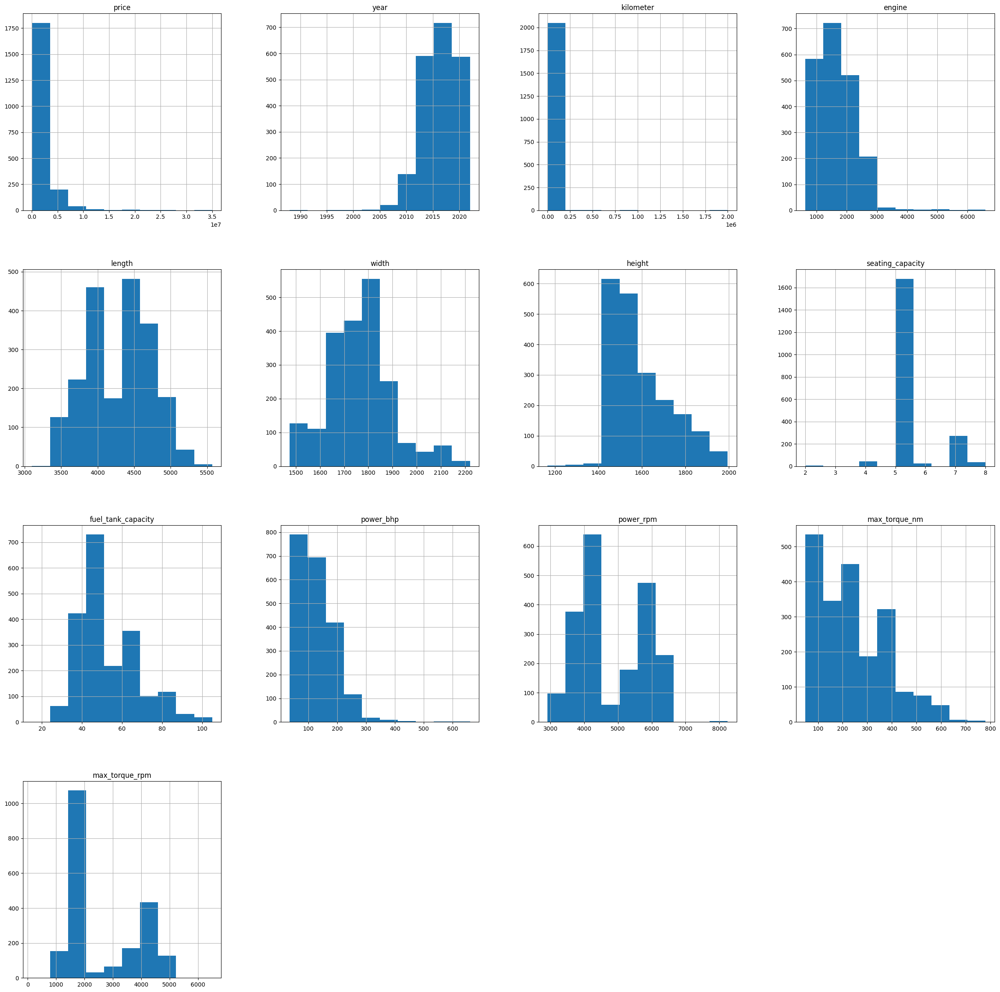

In [ ]:
df.hist(figsize=(30,30))
plt.show()

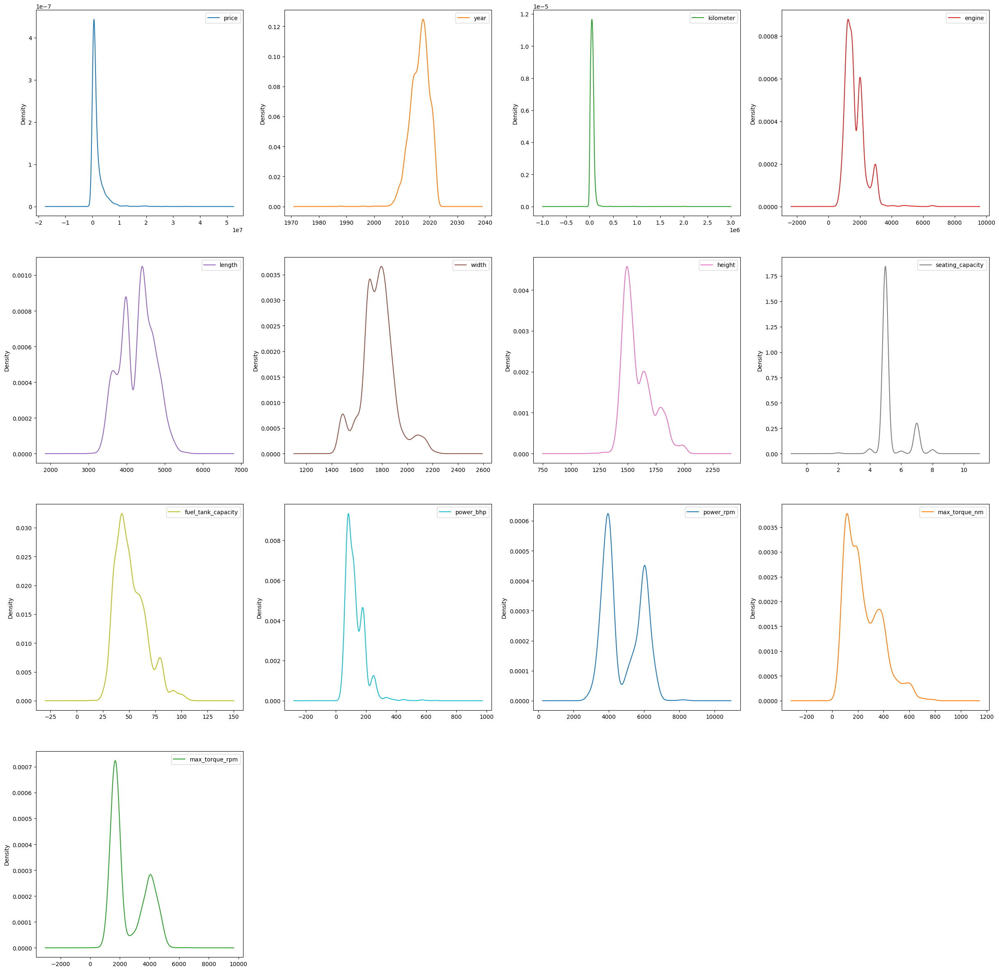

In [ ]:
#KDP
df.plot(kind='density',subplots=True, figsize=(30,30), sharex=False,layout=(4, 4),)
plt.show()

**Box Plots.(good for identifying potential outliers)**

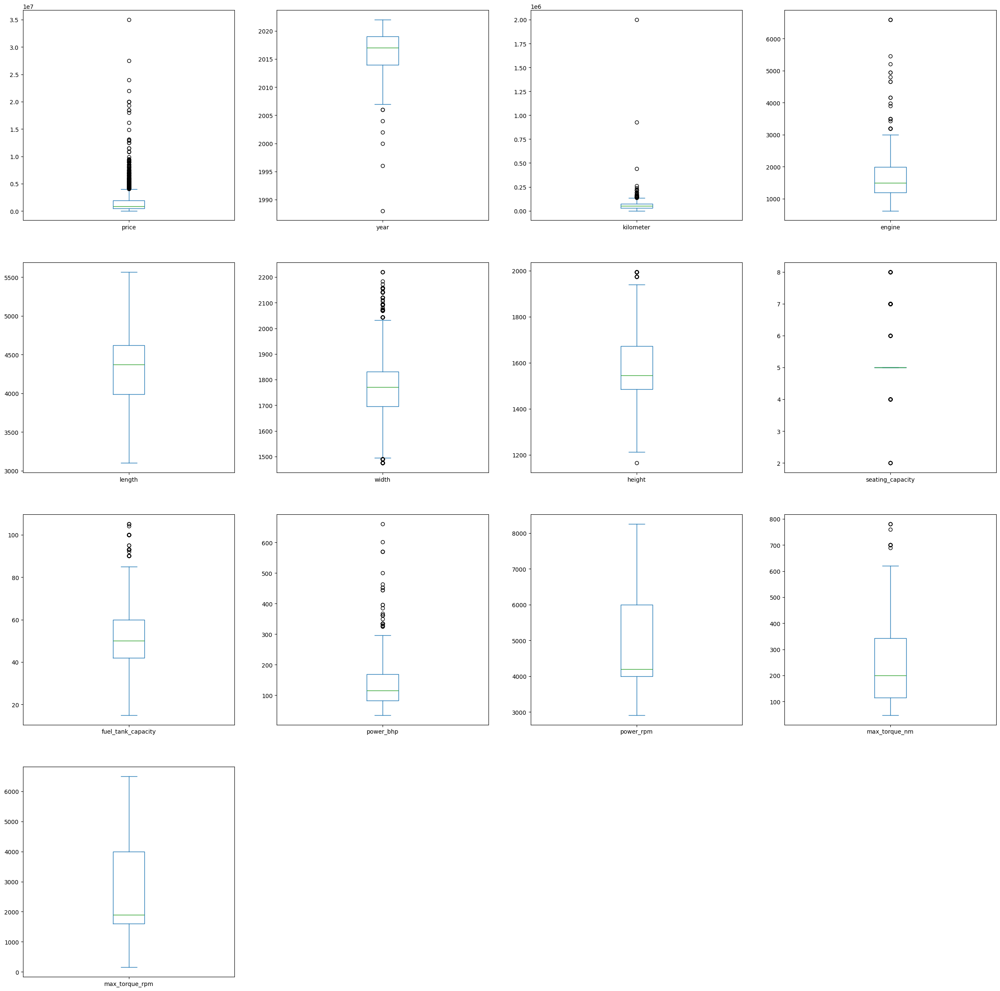

In [ ]:
df.plot(kind='box',subplots=True, sharex=False, layout=(4,4), figsize=(30,30))
plt.show()

**○​ Skewness and Kurtosis: Check the symmetry and tailedness of the distribution.** **bold text**

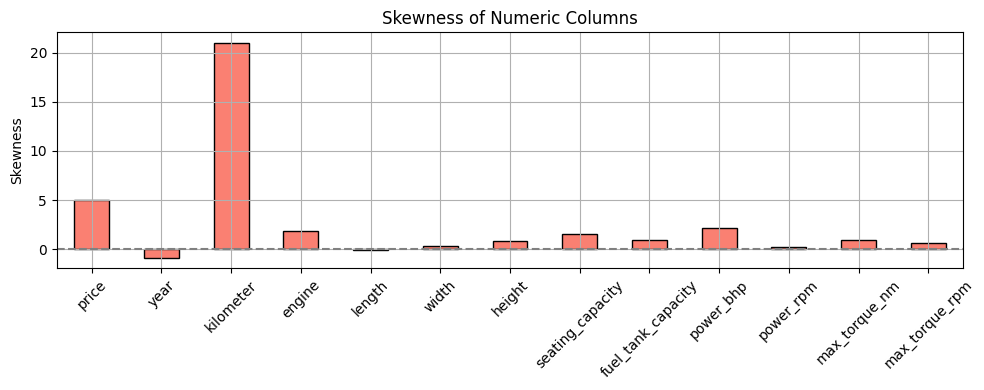

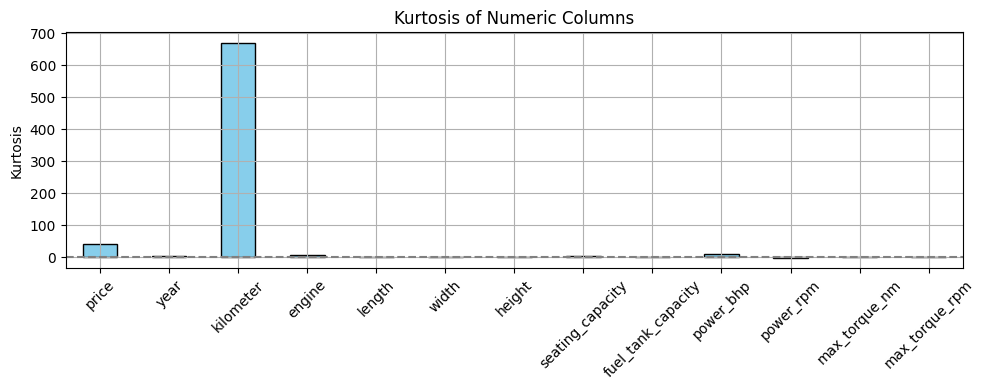

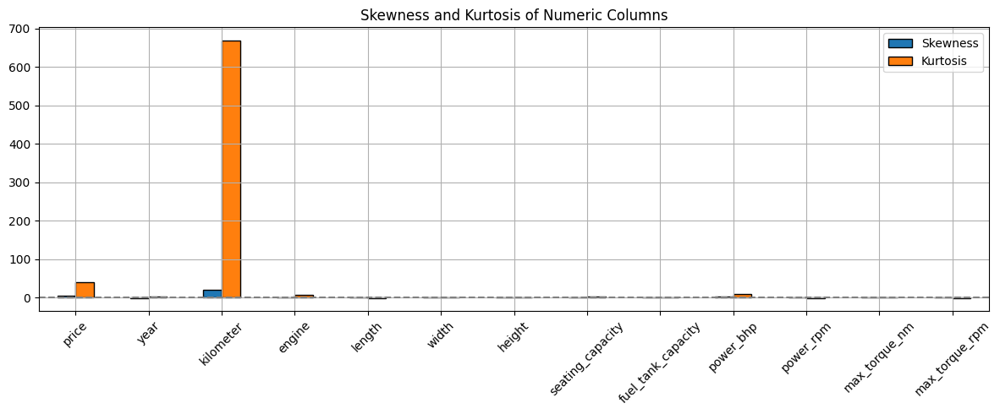

In [ ]:

%matplotlib inline


numeric_cols = df.select_dtypes(include='number')

# 2. Calculate skewness and kurtosis
skewness = numeric_cols.skew()
kurtosis = numeric_cols.kurt()

# 3. Plot skewness
plt.figure(figsize=(10, 4))
skewness.plot(kind='bar', color='salmon', edgecolor='black')
plt.axhline(0, color='gray', linestyle='--')
plt.title('Skewness of Numeric Columns')
plt.ylabel('Skewness')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid()
plt.show()
#plt.savefig("1")

# 4. Plot kurtosis
plt.figure(figsize=(10, 4))
kurtosis.plot(kind='bar', color='skyblue', edgecolor='black')
plt.axhline(0, color='gray', linestyle='--')
plt.title('Kurtosis of Numeric Columns')
plt.ylabel('Kurtosis')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()
#plt.savefig("2")


# 5. Combined Bar Plot
stats_df = pd.DataFrame({
    'Skewness': skewness,
    'Kurtosis': kurtosis
})

stats_df.plot(kind='bar', figsize=(12, 5), edgecolor='black')
plt.title('Skewness and Kurtosis of Numeric Columns')
plt.axhline(0, color='gray', linestyle='--')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()
#plt.savefig("3")



In [ ]:
obj_cols = df.select_dtypes(include='object').columns
df[obj_cols] = df[obj_cols].astype('string[python]')


In [ ]:
print(df.dtypes)

make                  string[python]
model                 string[python]
price                          int64
year                           int64
kilometer                      int64
fuel_type             string[python]
transmission          string[python]
location              string[python]
color                 string[python]
owner                 string[python]
seller_ype            string[python]
engine                       float64
drivetrain            string[python]
length                       float64
width                        float64
height                       float64
seating_capacity             float64
fuel_tank_capacity           float64
power_bhp                    float64
power_rpm                    float64
max_torque_nm                float64
max_torque_rpm               float64
dtype: object


**Categorical Variables:**

In [ ]:
categorical_cols = df.select_dtypes(include=['string[python]']).columns

In [ ]:
print(categorical_cols)

Index(['make', 'model', 'fuel_type', 'transmission', 'location', 'color',
       'owner', 'seller_ype', 'drivetrain'],
      dtype='object')


In [ ]:
for col in df.select_dtypes(include=['string']):
    print(f"\n Column: {col}")

    counts = df[col].value_counts(dropna=False)
    proportions = counts / counts.sum() * 100

    summary = pd.DataFrame({
        'Count': counts,
        'Proportion (%)': proportions.round(2)
    })

    print(summary)



 Column: make
               Count  Proportion (%)
make                                
maruti_suzuki    440           21.37
hyundai          349           16.95
mercedes-benz    171            8.31
honda            158            7.67
toyota           132            6.41
audi             127            6.17
bmw              121            5.88
mahindra         119            5.78
tata              57            2.77
volkswagen        50            2.43
ford              48            2.33
renault           43            2.09
skoda             40            1.94
land_rover        33             1.6
kia               23            1.12
jeep              18            0.87
mg                17            0.83
jaguar            17            0.83
nissan            16            0.78
volvo             16            0.78
porsche           15            0.73
mini              11            0.53
datsun             8            0.39
chevrolet          7            0.34
lexus              6   

column name make


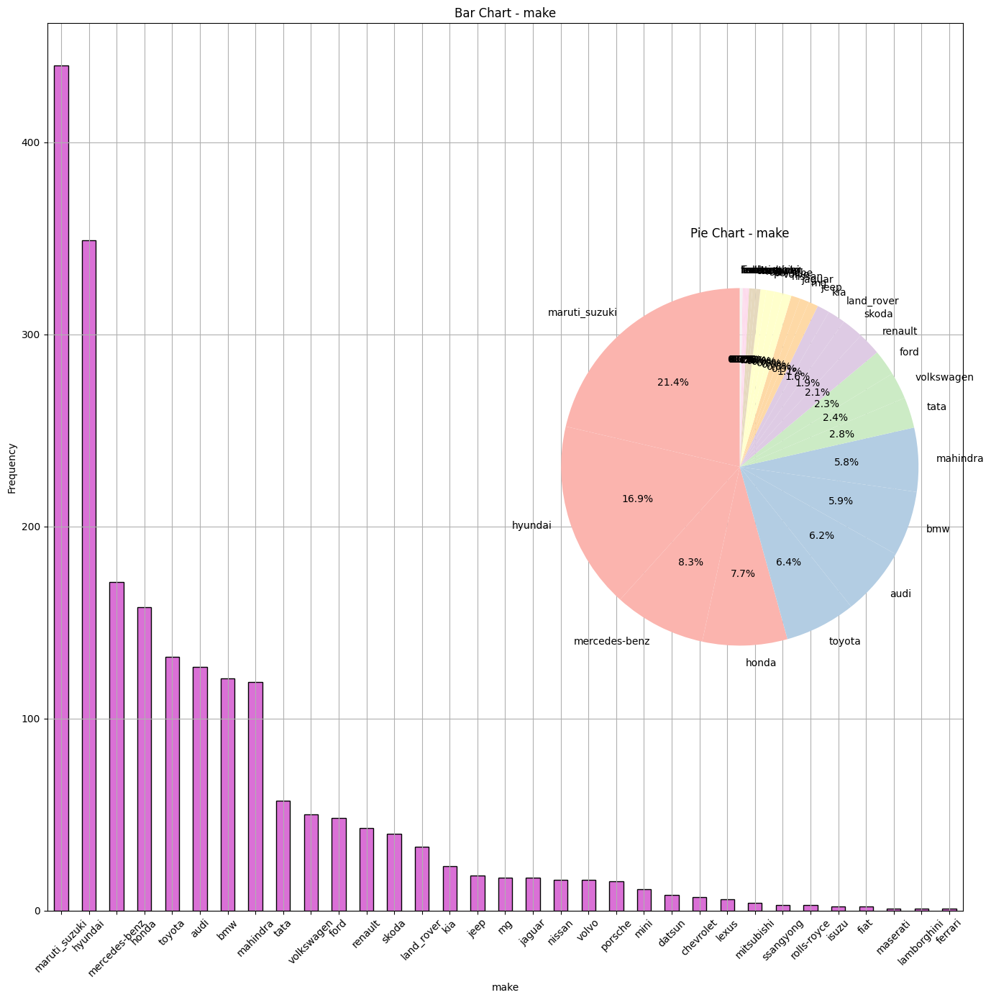

column name model


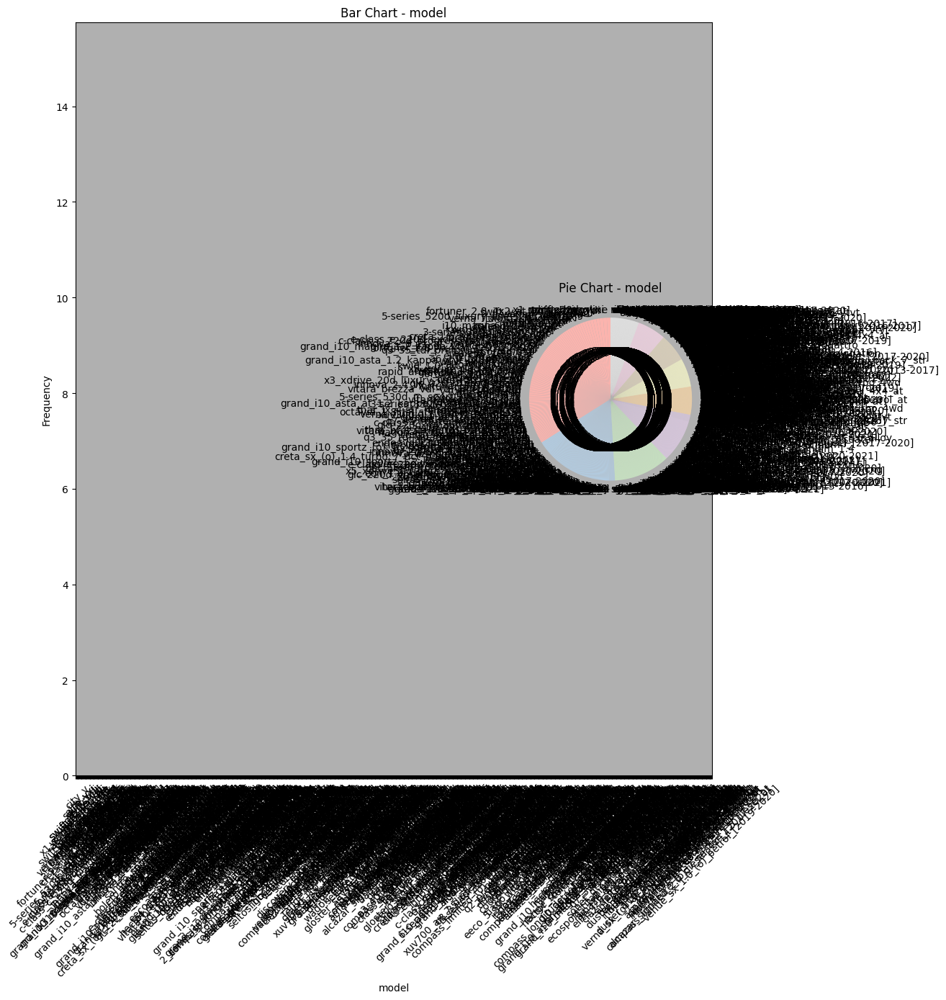

column name fuel_type


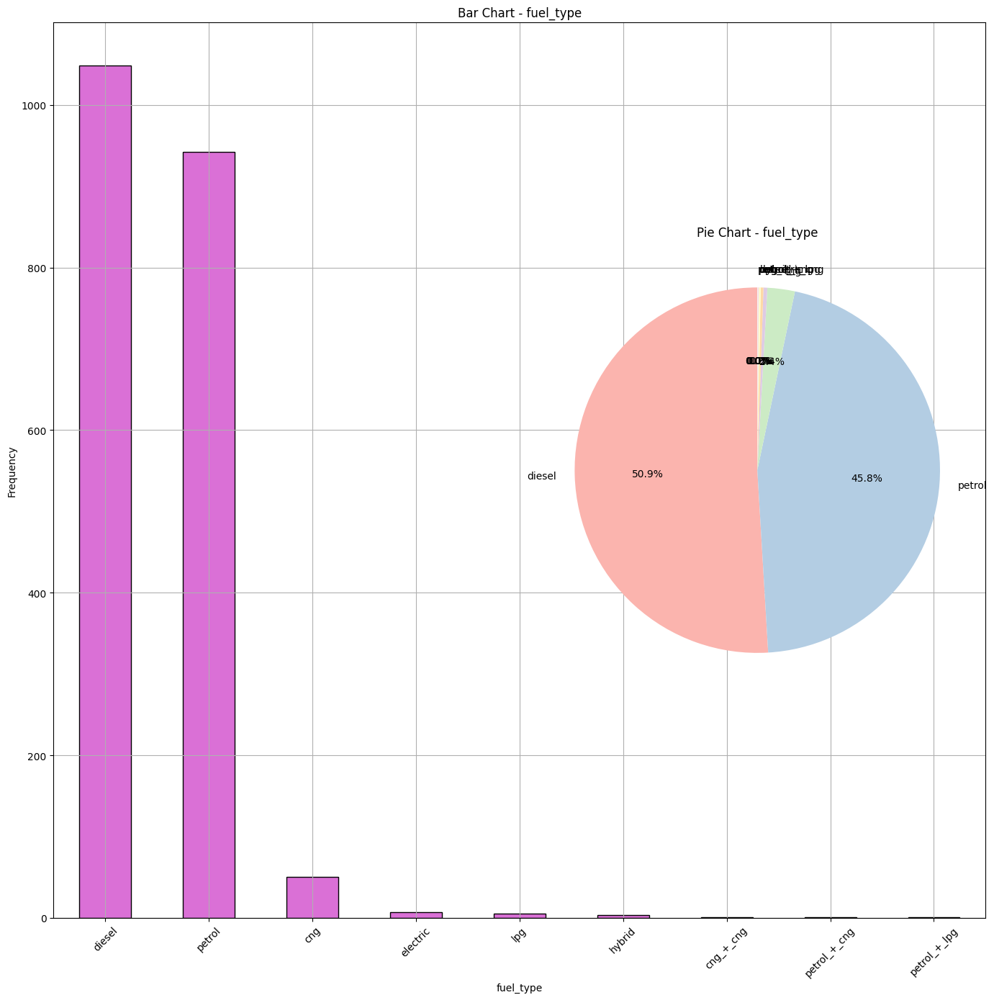

column name transmission


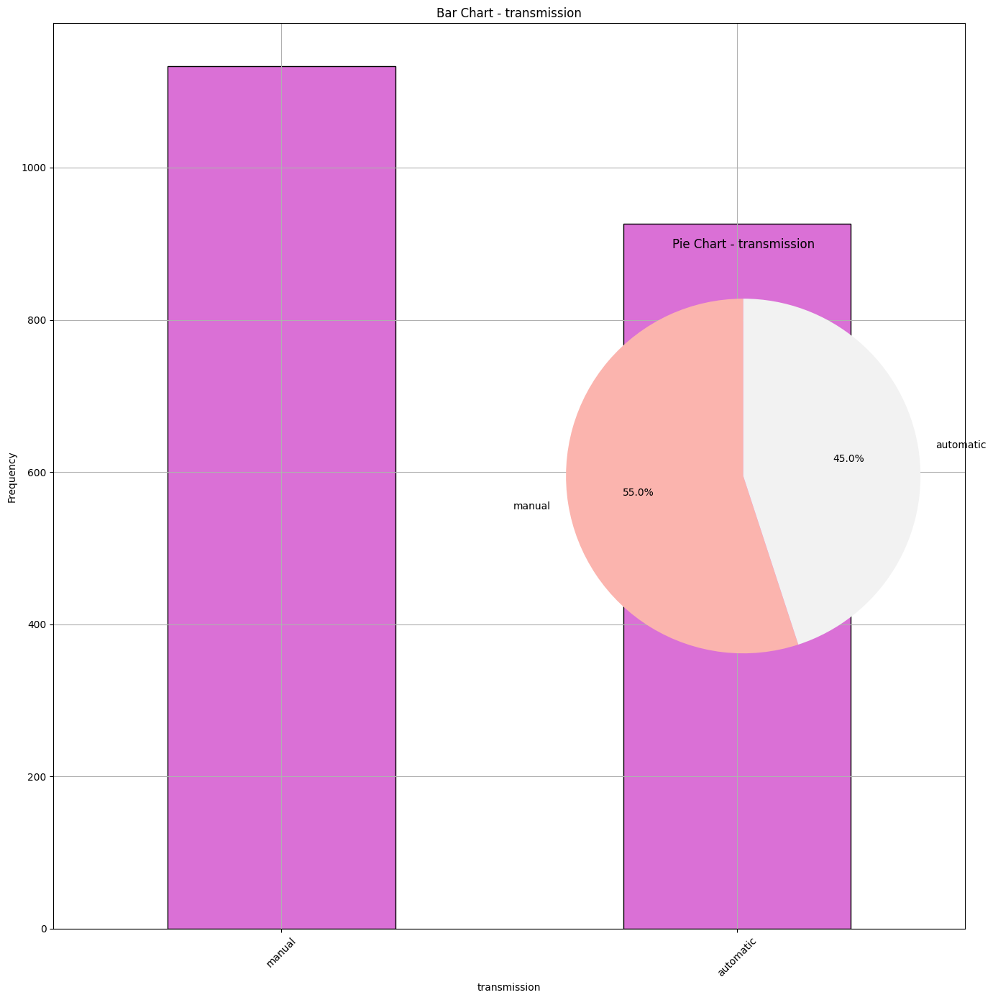

column name location


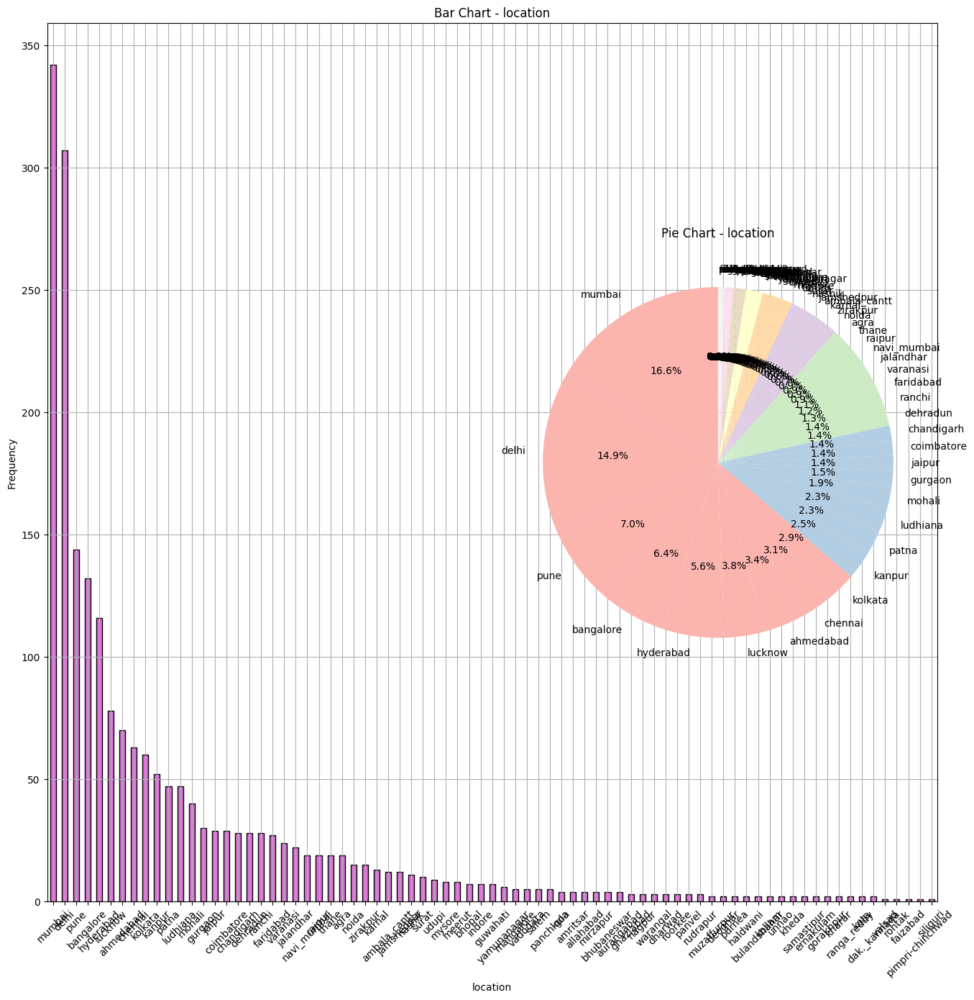

column name color


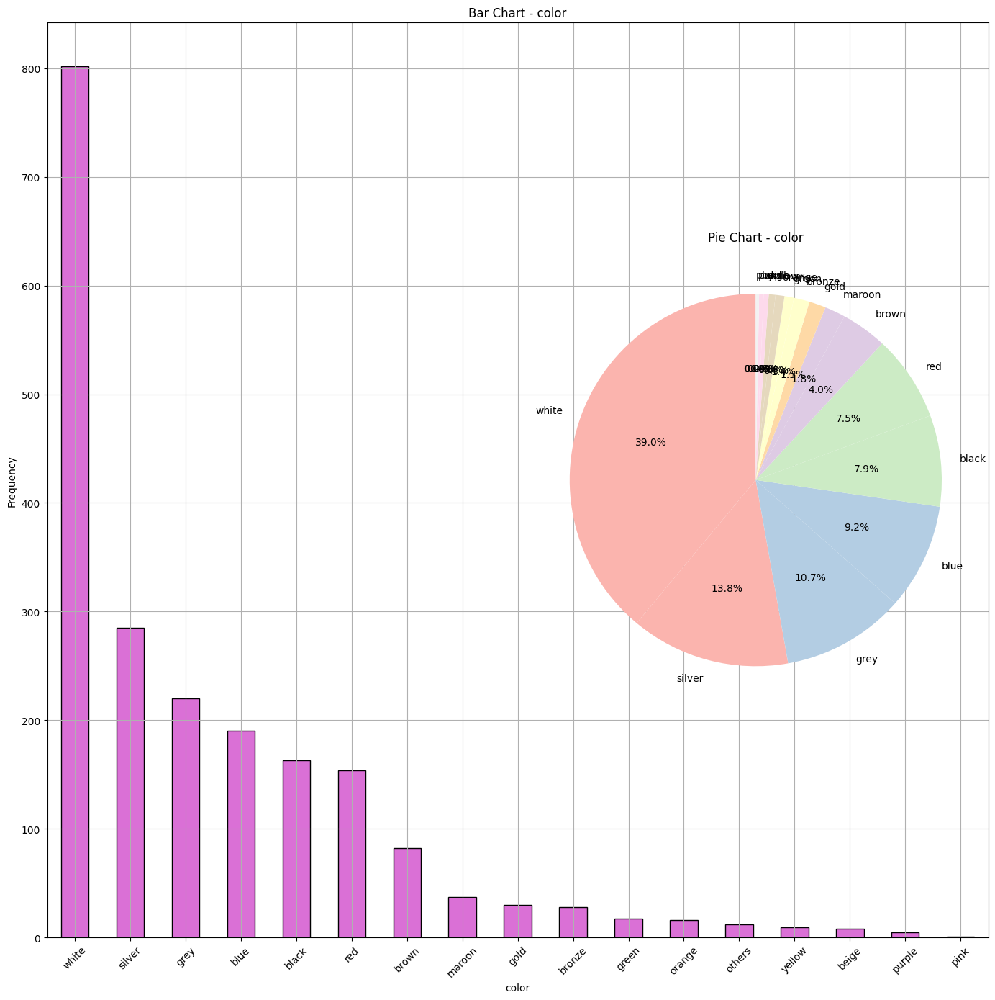

column name owner


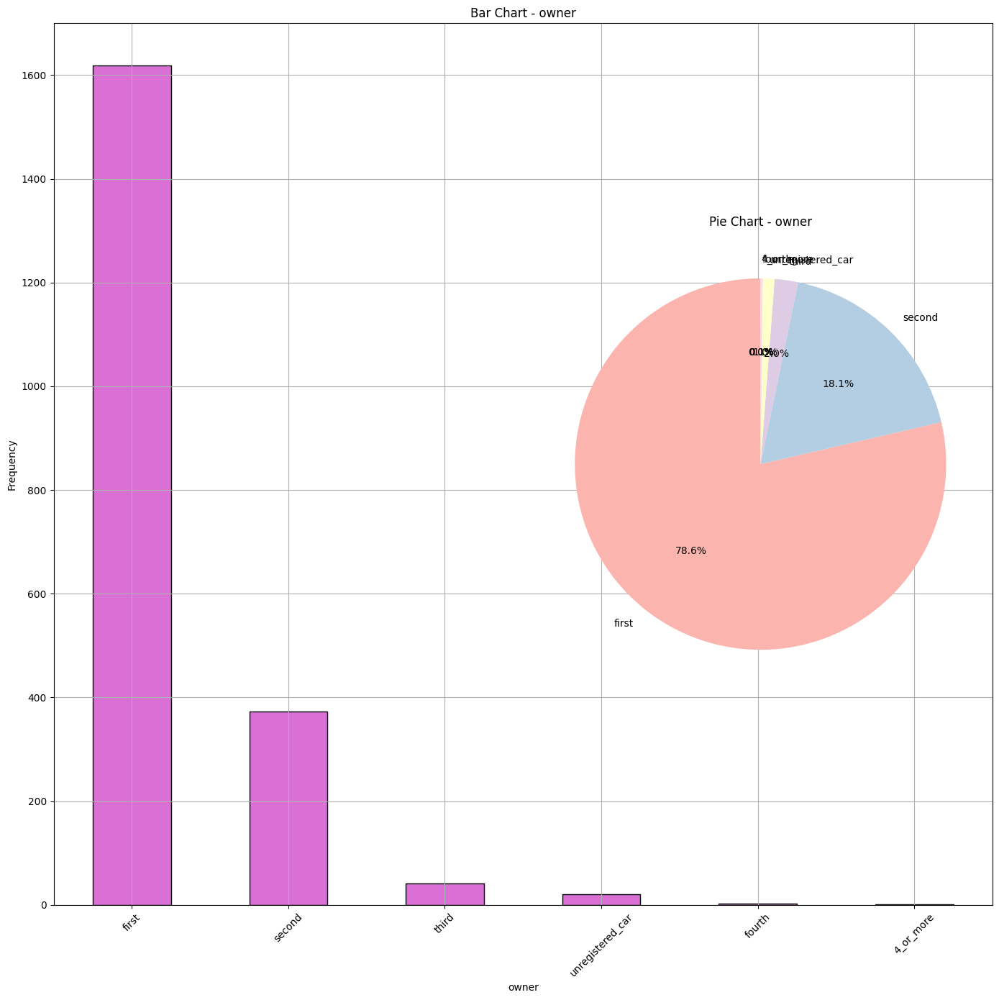

column name seller_ype


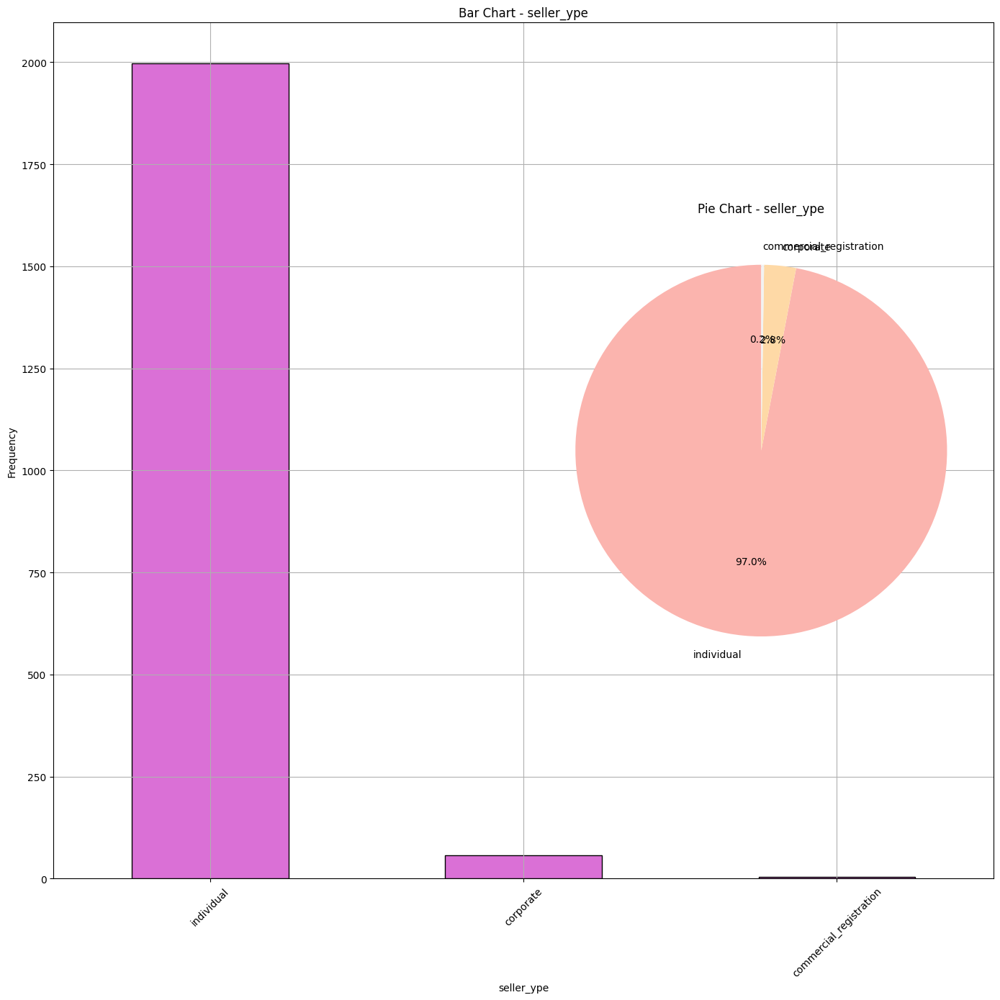

column name drivetrain


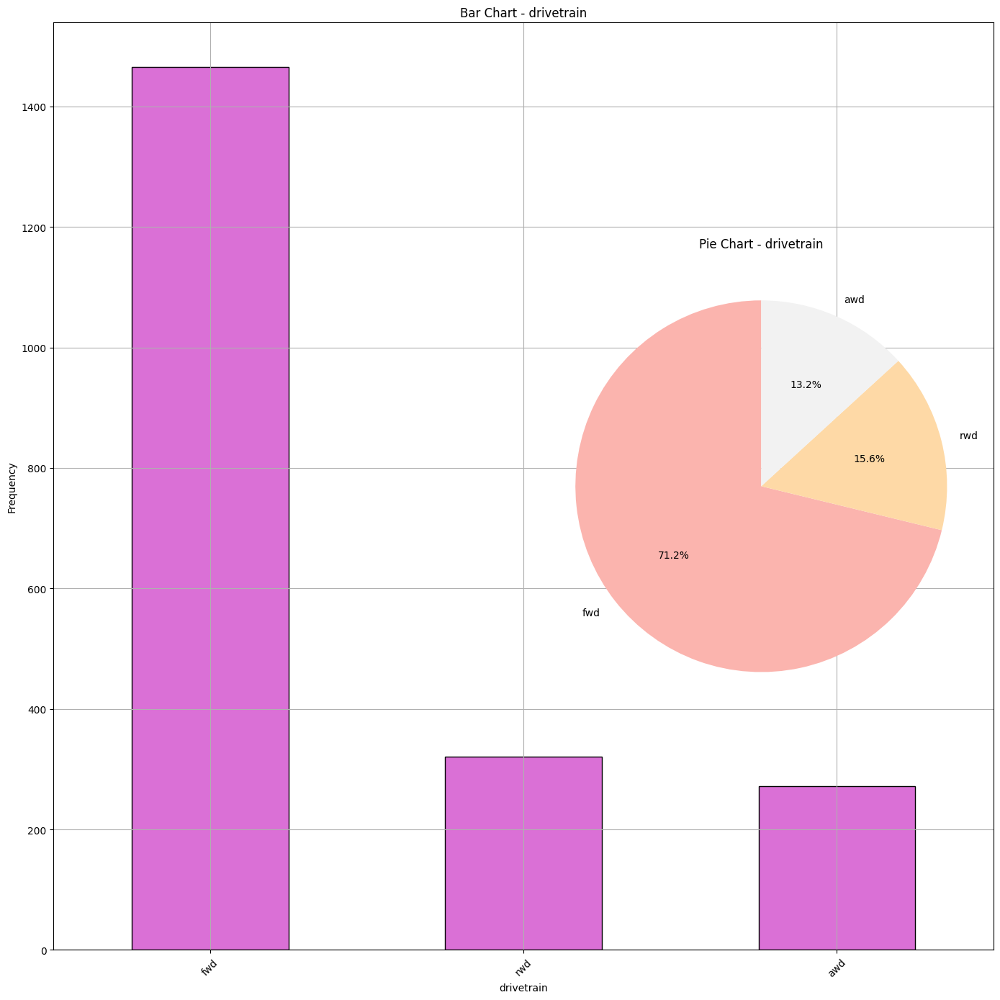

In [ ]:

%matplotlib inline

# Loop over columns with string (object) or category data type
for col in df.select_dtypes(include=['string[python]']).columns:
    counts = df[col].value_counts()  # Top 10 for clarity
    print("column name",col)

    if df[col].nunique(dropna=True) < 2:
      continue


    plt.figure(figsize=(14, 14))

    # 🔹 Bar Chart
    plt.subplot(1, 1, 1)
    counts.plot(kind='bar', color='orchid', edgecolor='black')
    plt.title(f'Bar Chart - {col}')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.grid(True)

    # 🔹 Pie Chart
    plt.subplot(1, 2, 2)
    counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colormap='Pastel1')
    plt.title(f'Pie Chart - {col}')
    plt.ylabel('')

    plt.tight_layout()
    plt.show()


**5.​ Bivariate/Multivariate Analysis (Analyzing Relationships Between Variables):**

Plotting: price vs year


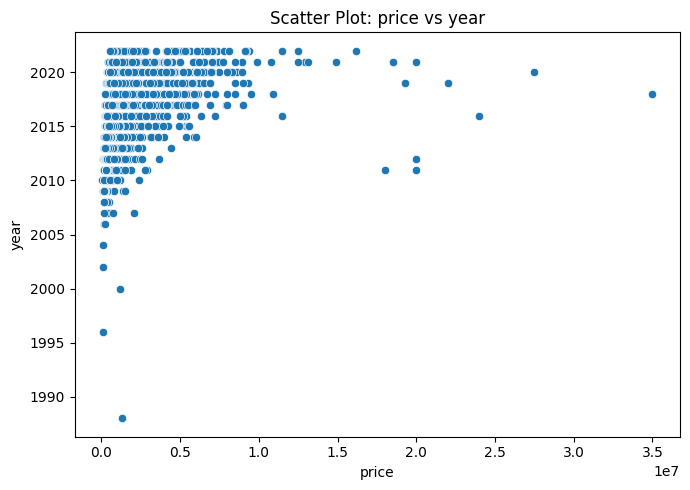

Plotting: price vs kilometer


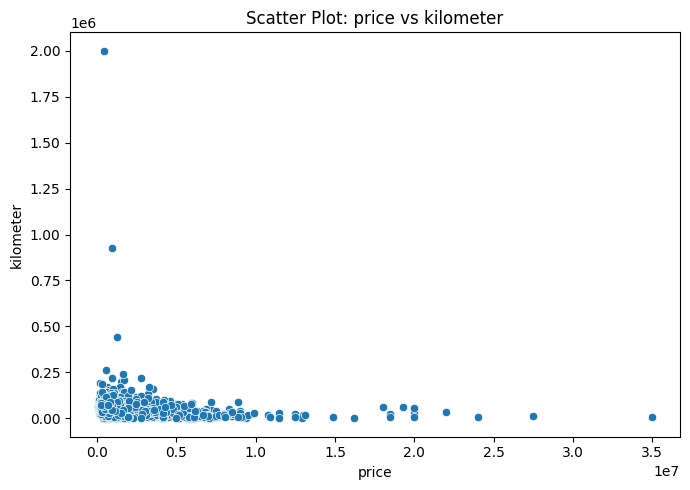

Plotting: price vs engine


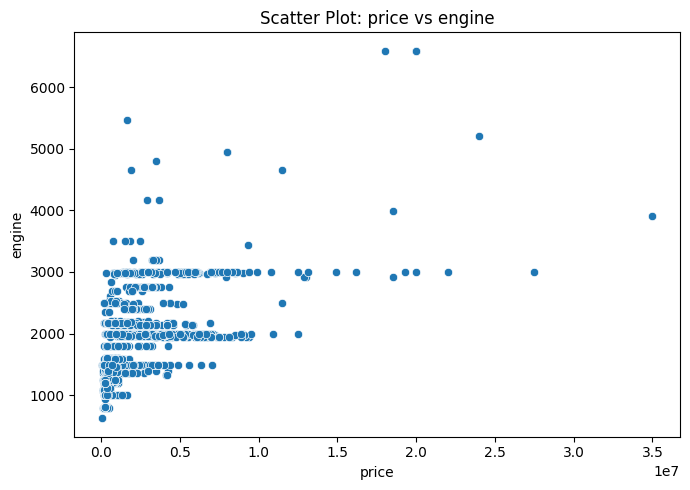

Plotting: price vs length


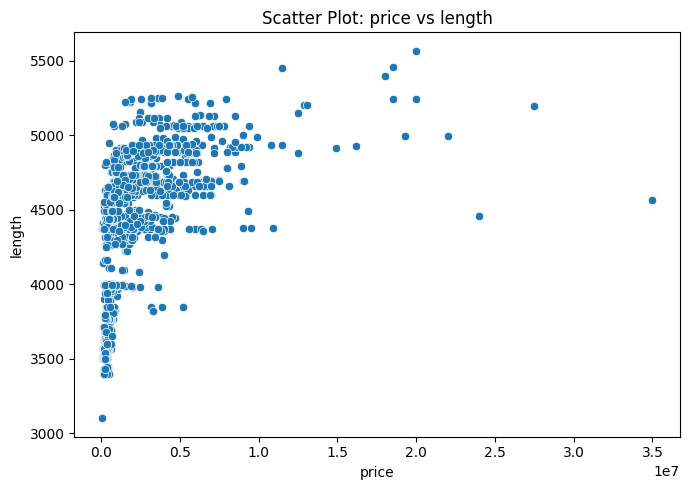

Plotting: price vs width


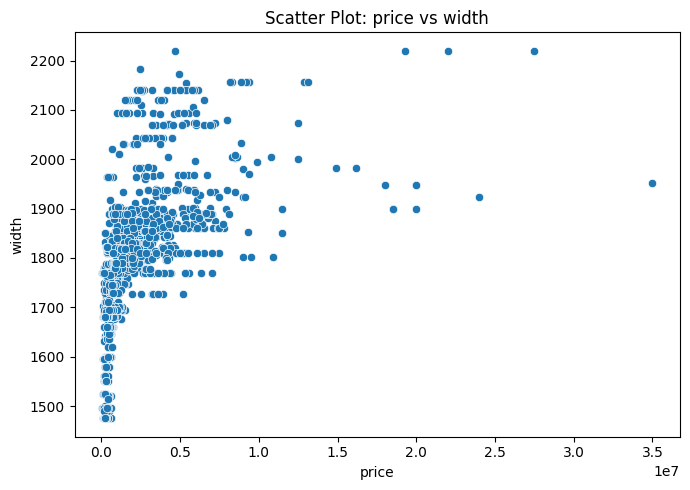

Plotting: price vs height


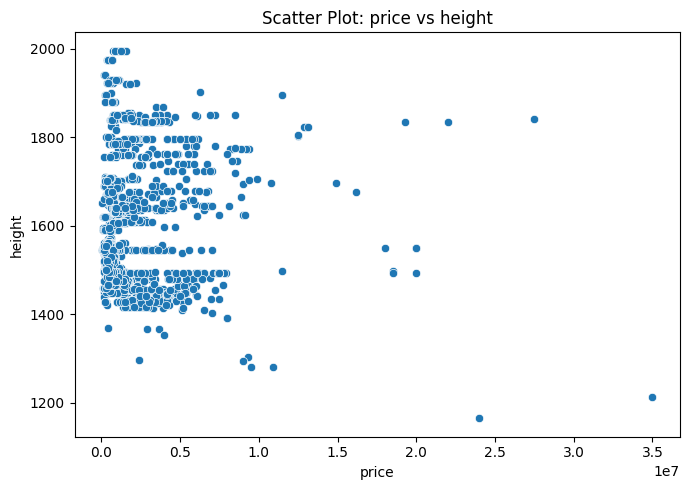

Plotting: price vs seating_capacity


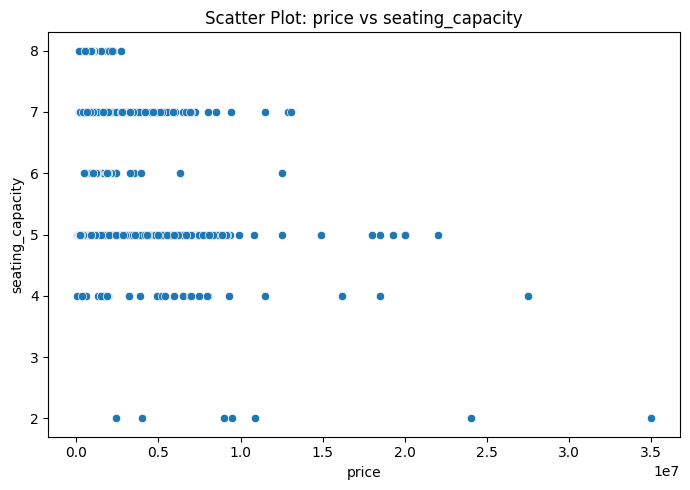

Plotting: price vs fuel_tank_capacity


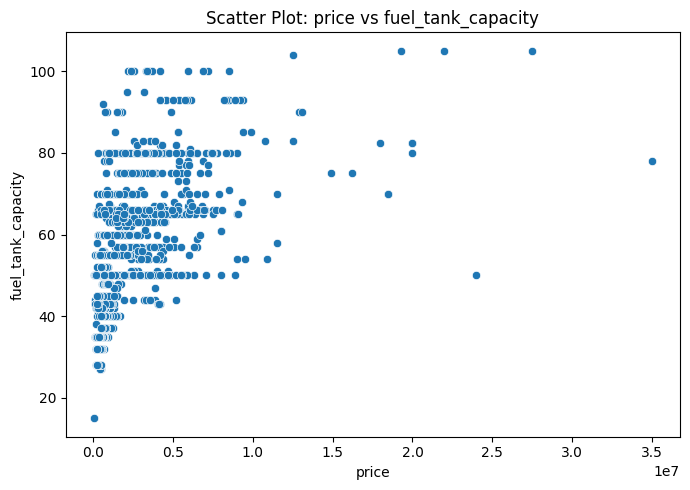

Plotting: price vs power_bhp


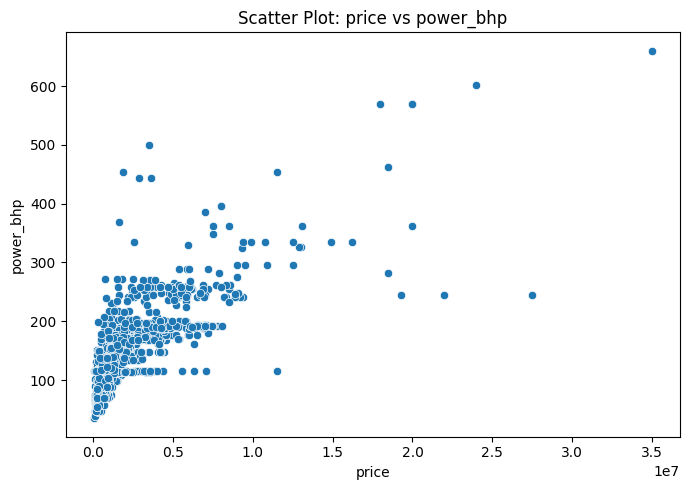

Plotting: price vs power_rpm


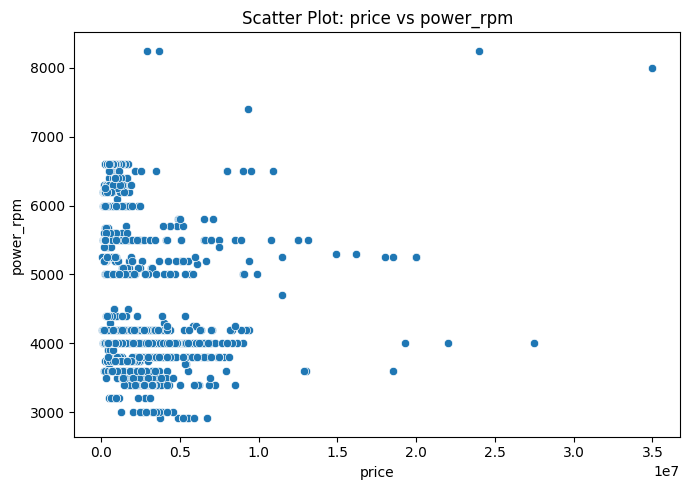

Plotting: price vs max_torque_nm


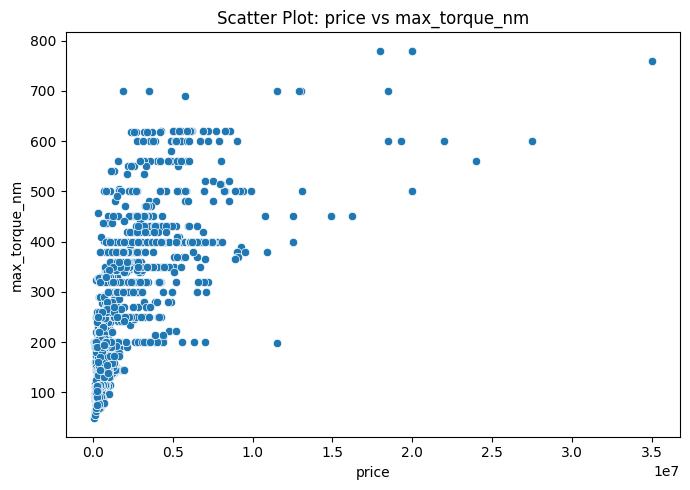

Plotting: price vs max_torque_rpm


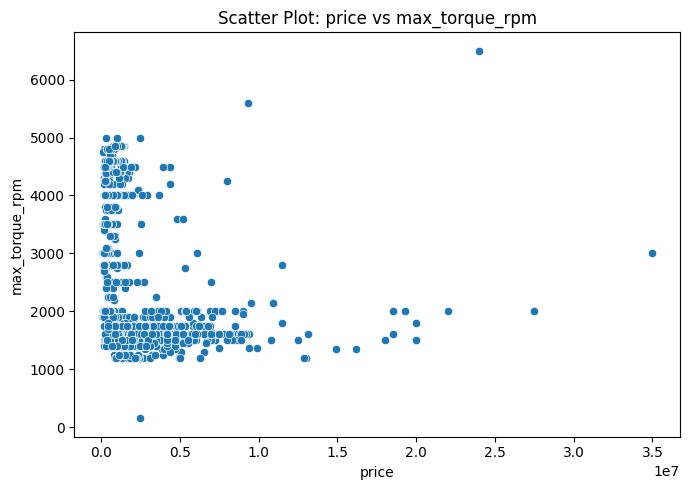

Plotting: year vs kilometer


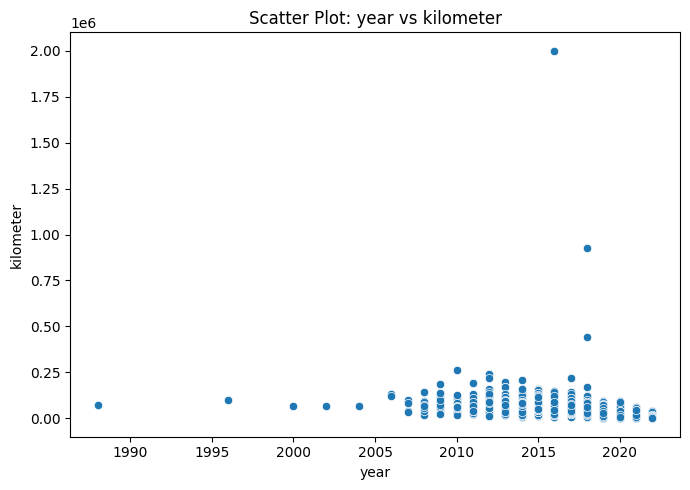

Plotting: year vs engine


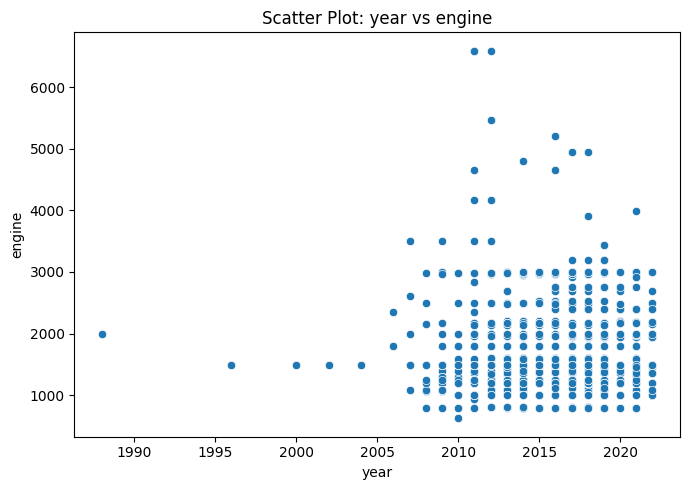

Plotting: year vs length


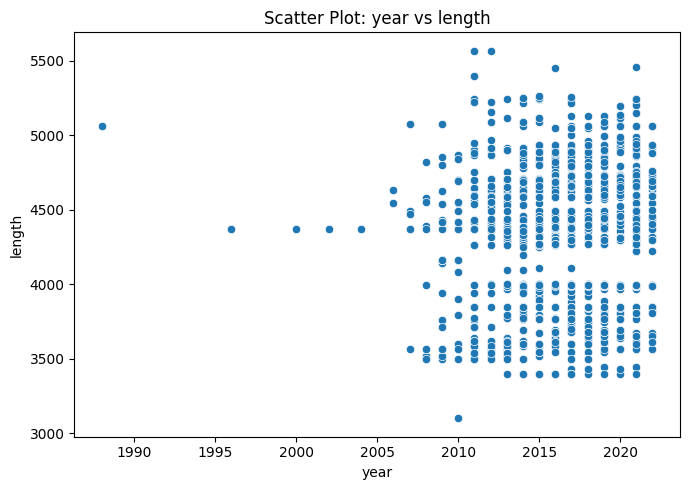

Plotting: year vs width


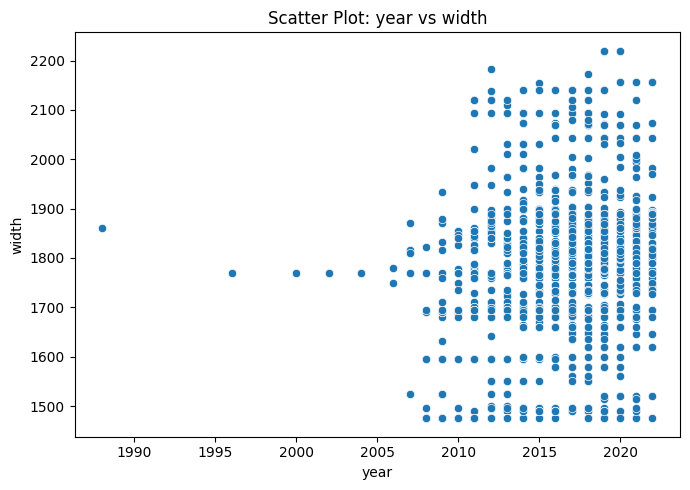

Plotting: year vs height


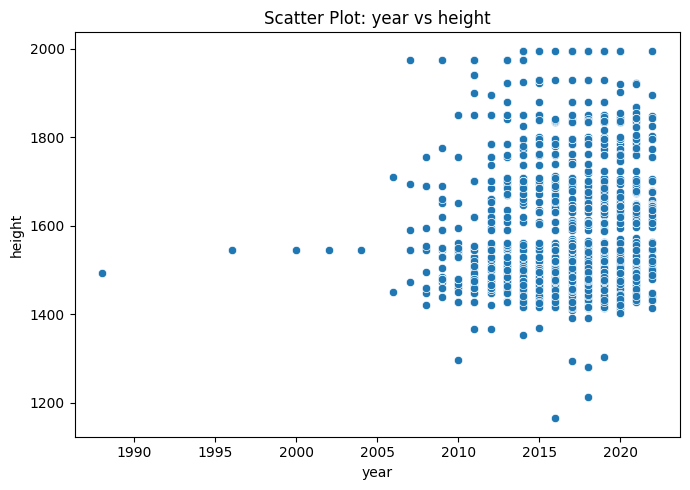

Plotting: year vs seating_capacity


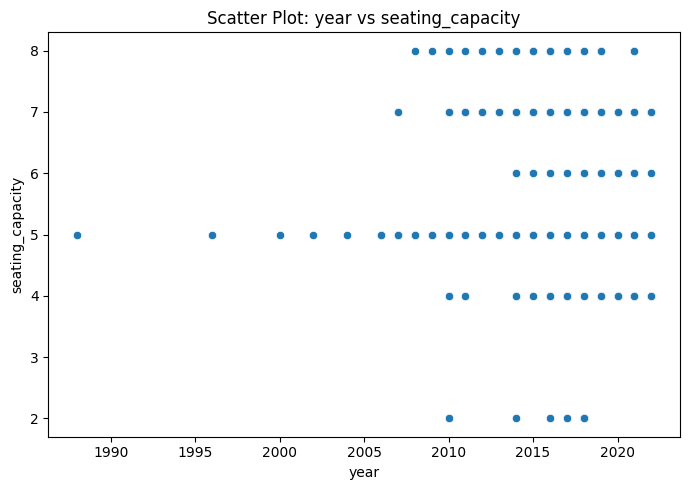

Plotting: year vs fuel_tank_capacity


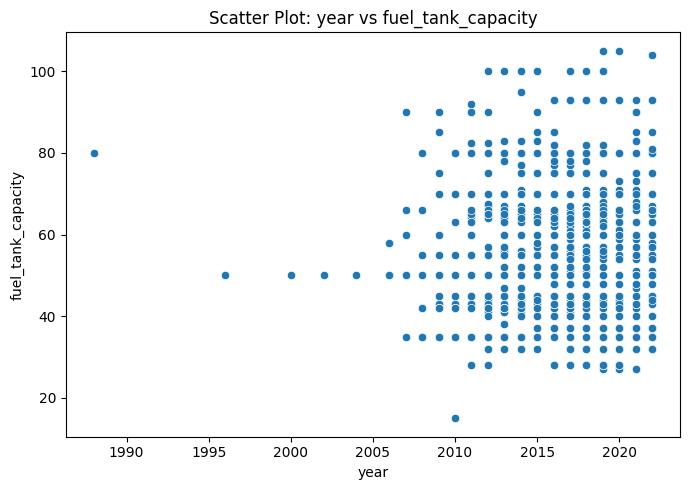

Plotting: year vs power_bhp


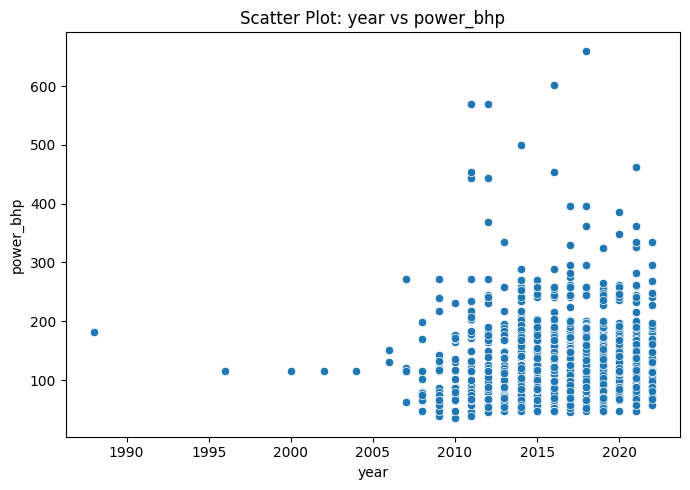

Plotting: year vs power_rpm


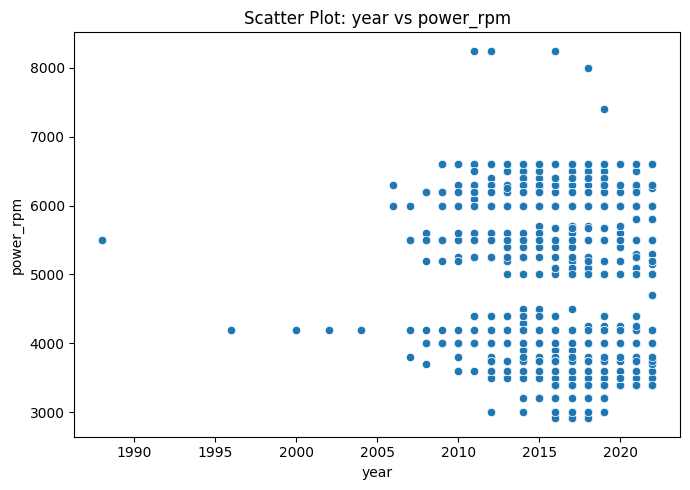

Plotting: year vs max_torque_nm


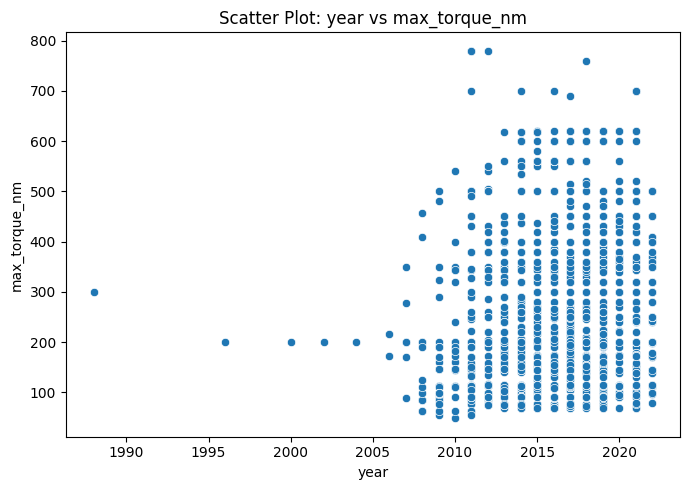

Plotting: year vs max_torque_rpm


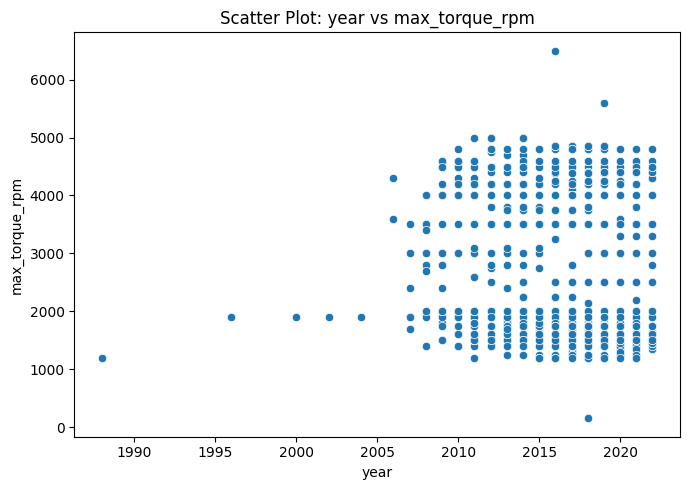

Plotting: kilometer vs engine


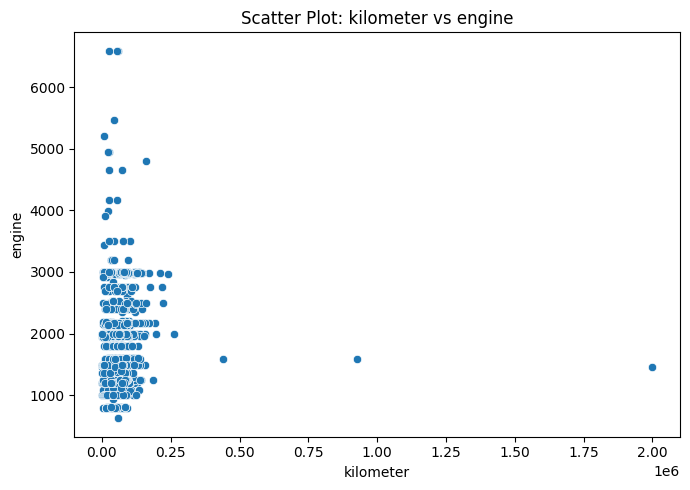

Plotting: kilometer vs length


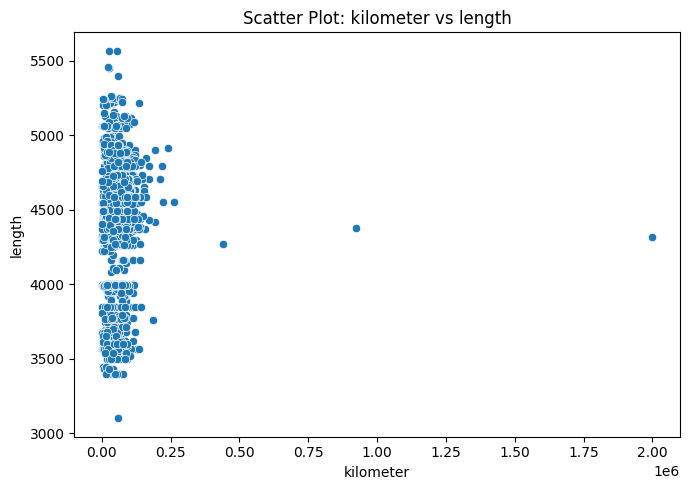

Plotting: kilometer vs width


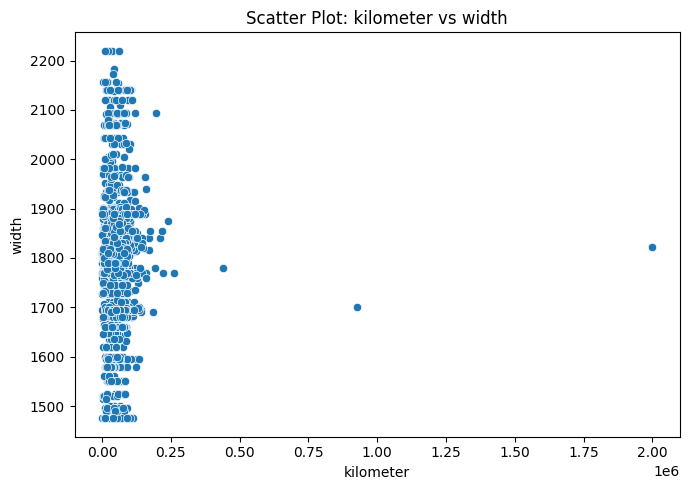

Plotting: kilometer vs height


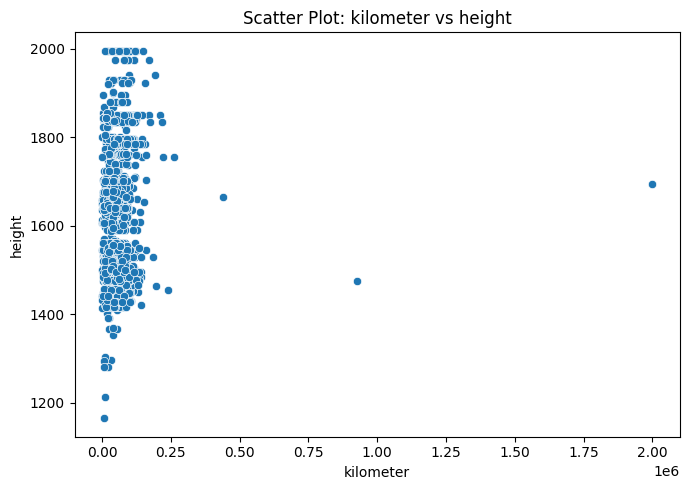

Plotting: kilometer vs seating_capacity


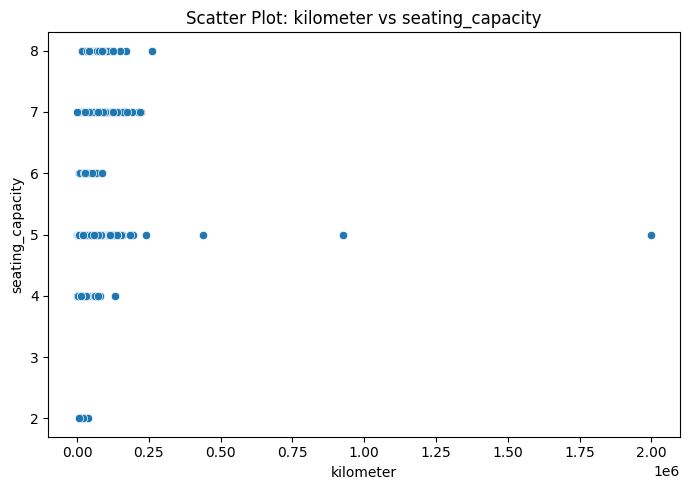

Plotting: kilometer vs fuel_tank_capacity


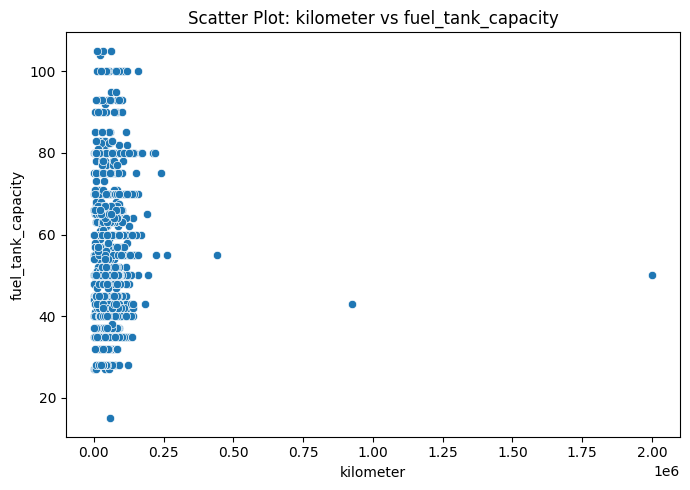

Plotting: kilometer vs power_bhp


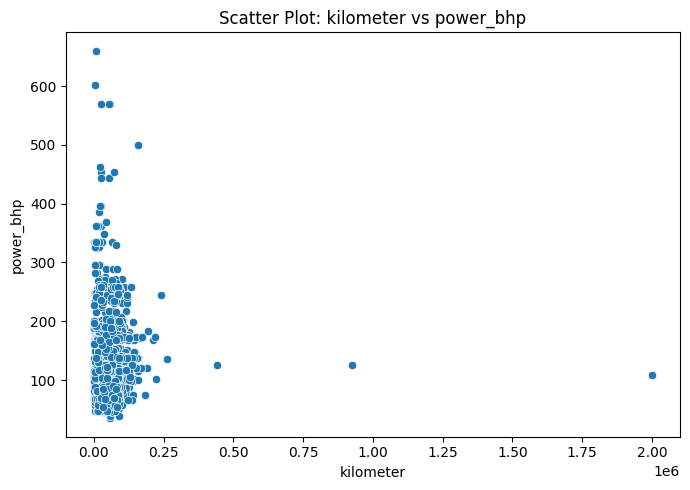

Plotting: kilometer vs power_rpm


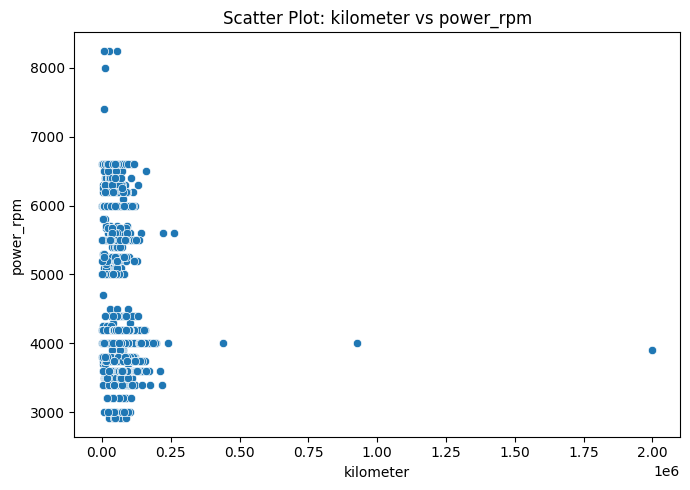

Plotting: kilometer vs max_torque_nm


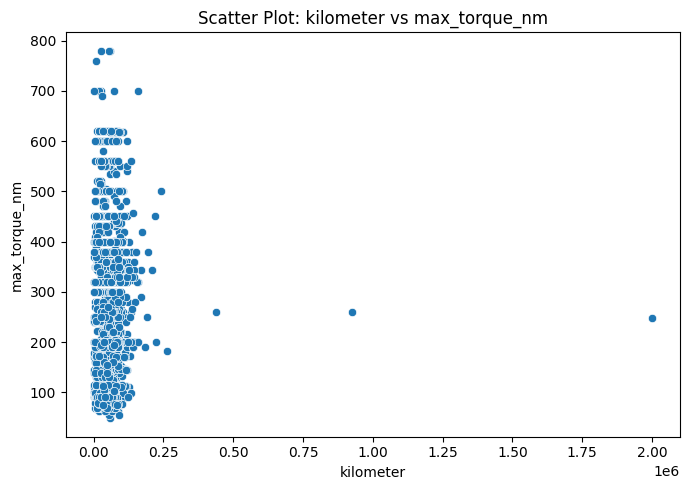

Plotting: kilometer vs max_torque_rpm


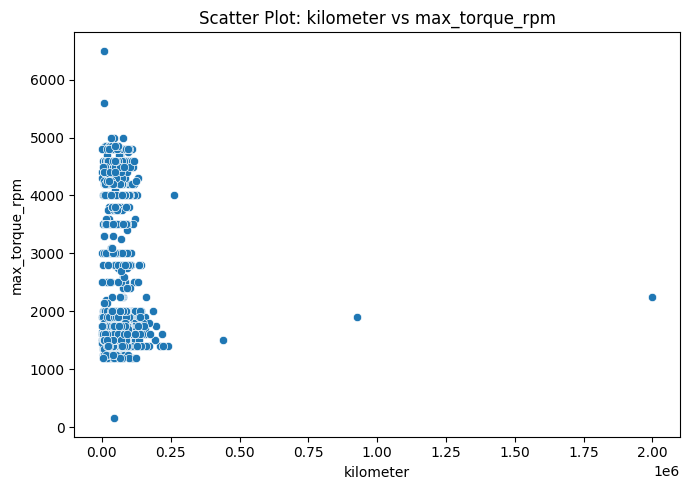

Plotting: engine vs length


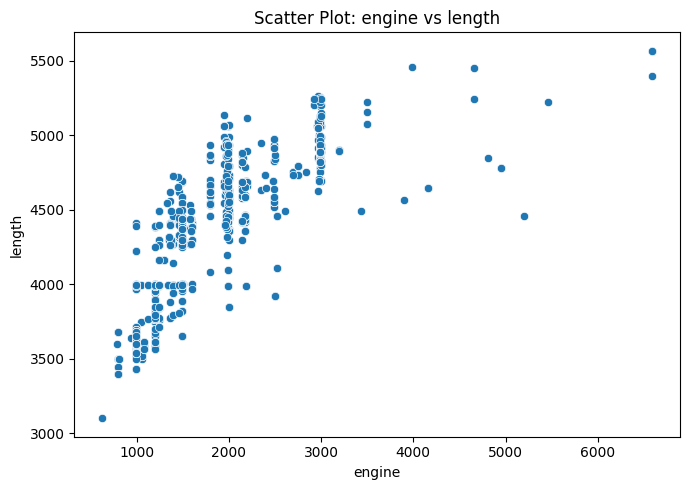

Plotting: engine vs width


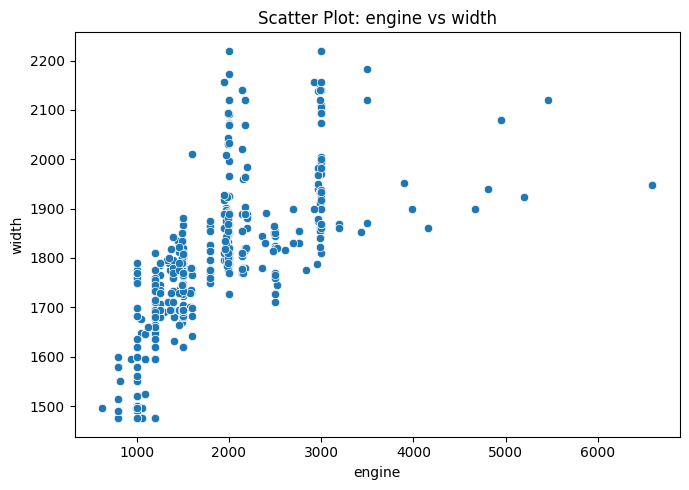

Plotting: engine vs height


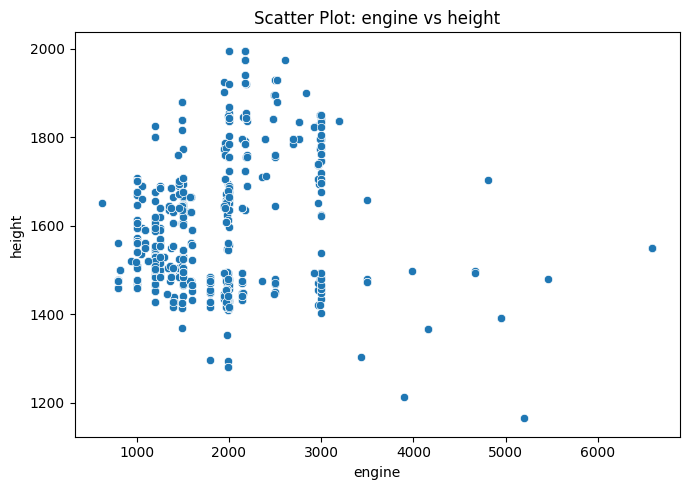

Plotting: engine vs seating_capacity


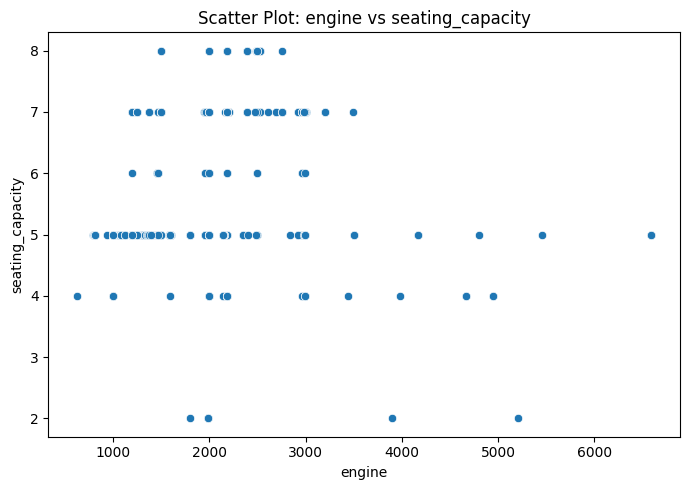

Plotting: engine vs fuel_tank_capacity


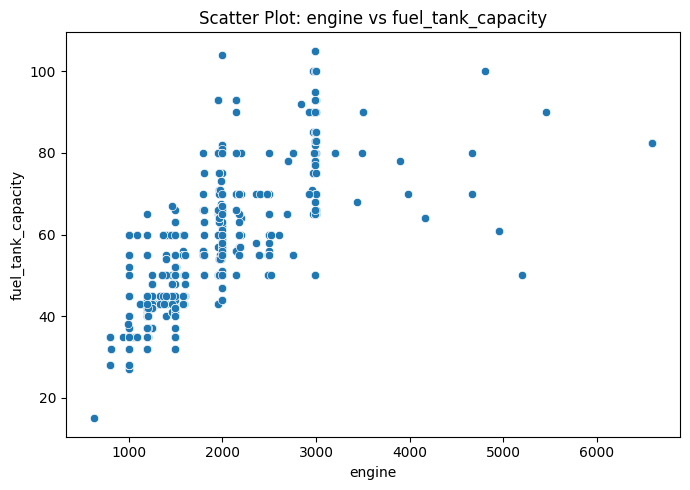

Plotting: engine vs power_bhp


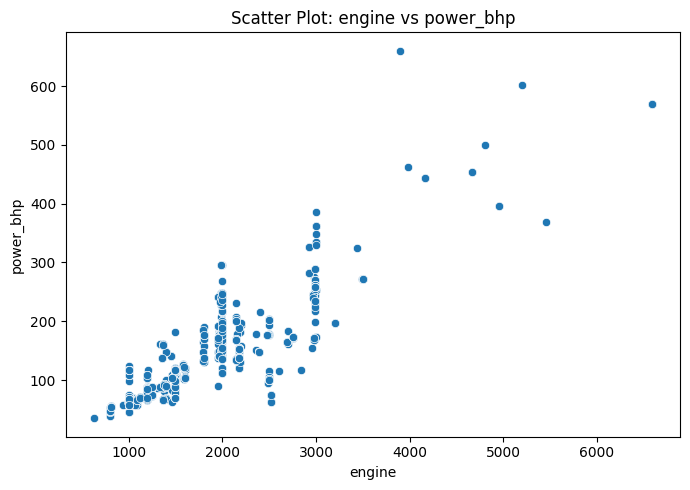

Plotting: engine vs power_rpm


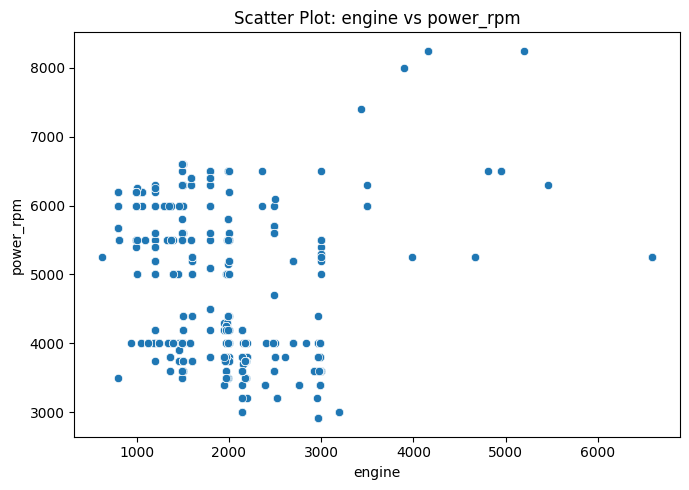

Plotting: engine vs max_torque_nm


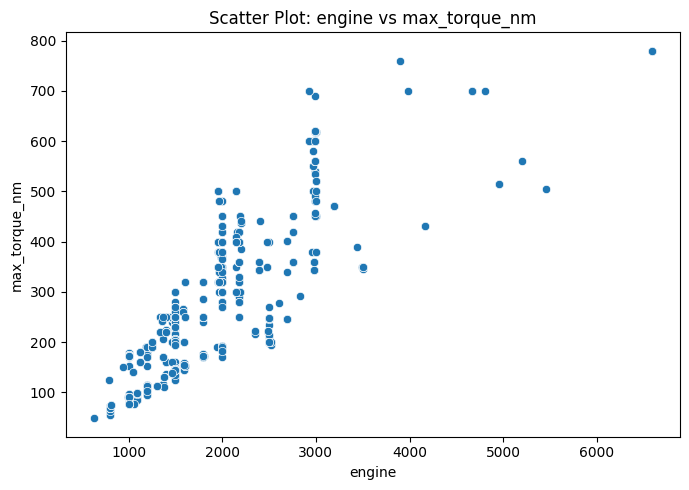

Plotting: engine vs max_torque_rpm


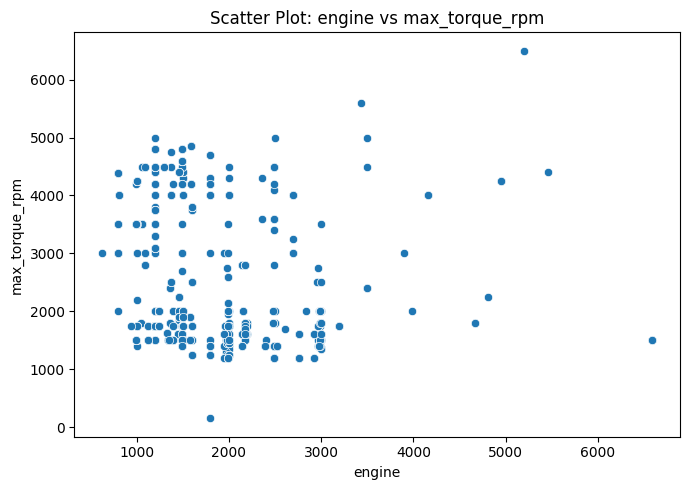

Plotting: length vs width


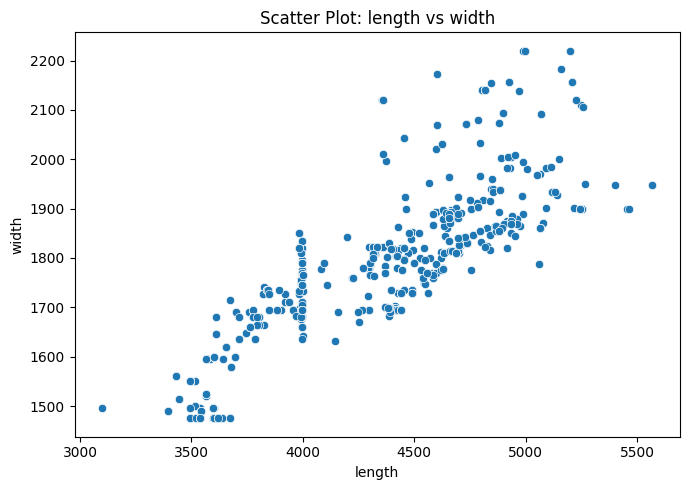

Plotting: length vs height


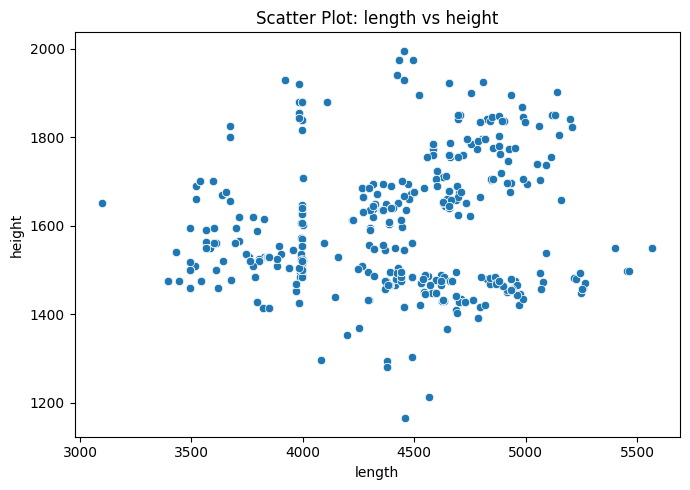

Plotting: length vs seating_capacity


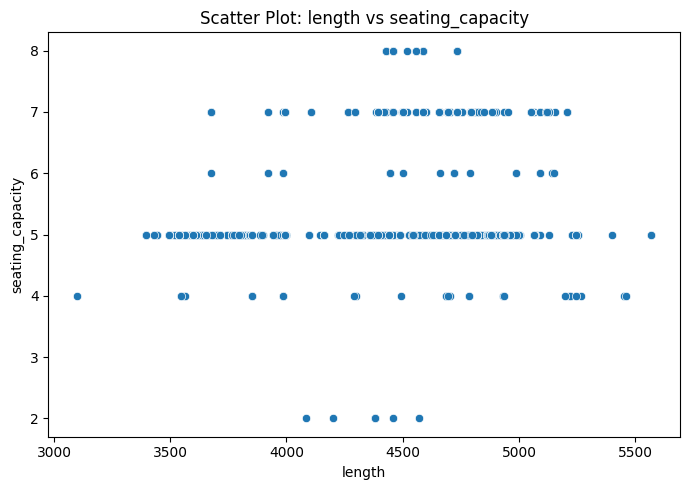

Plotting: length vs fuel_tank_capacity


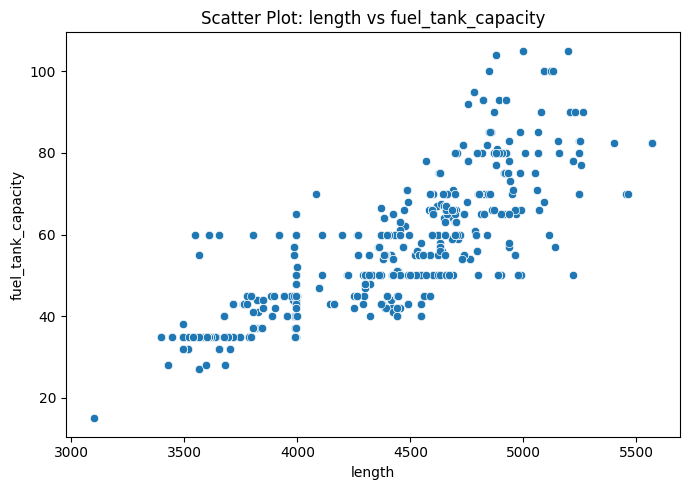

Plotting: length vs power_bhp


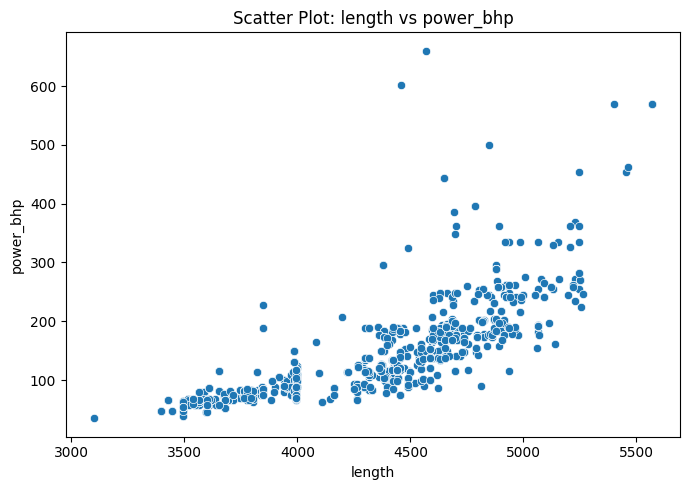

Plotting: length vs power_rpm


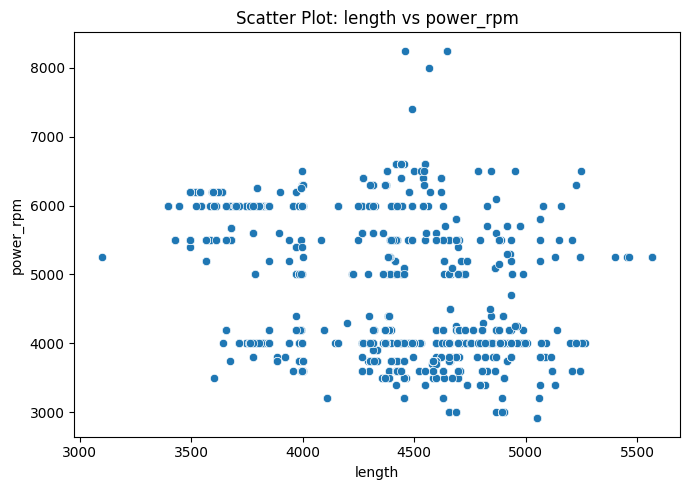

Plotting: length vs max_torque_nm


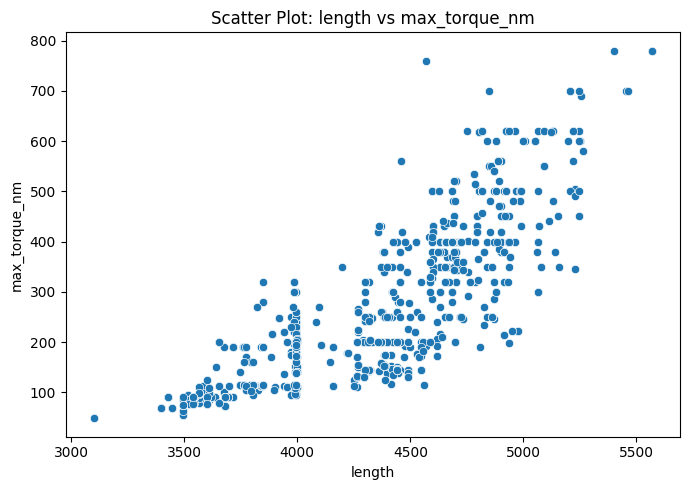

Plotting: length vs max_torque_rpm


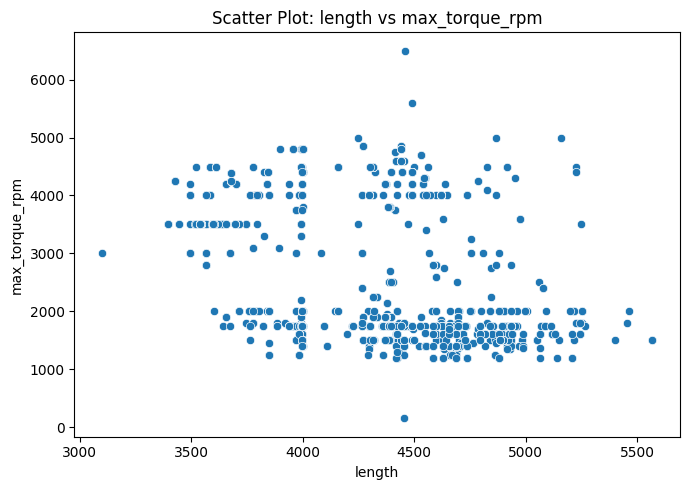

Plotting: width vs height


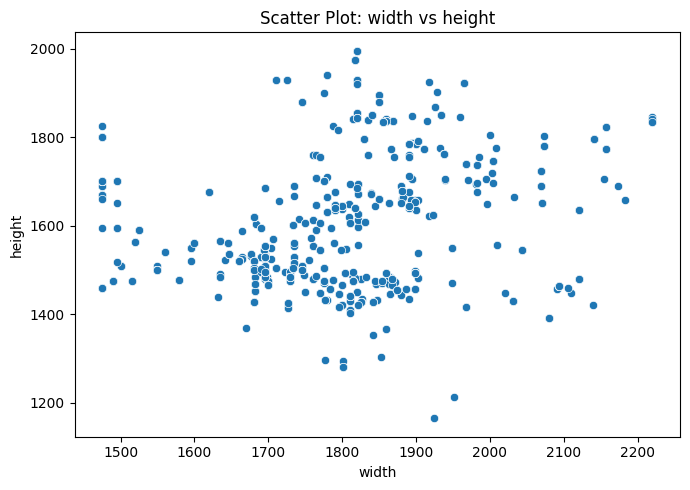

Plotting: width vs seating_capacity


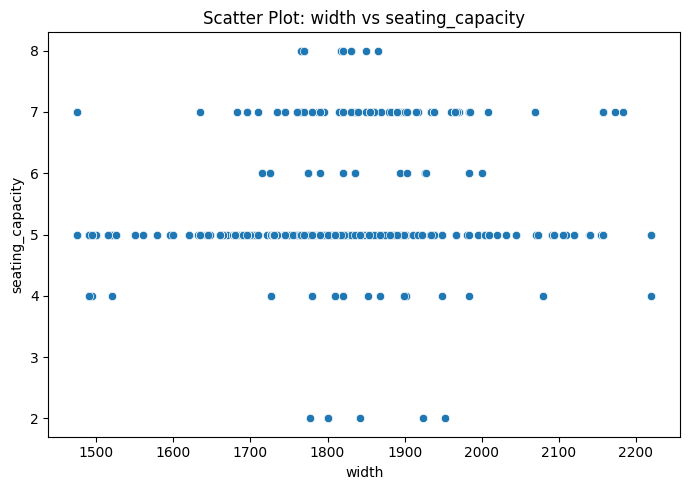

Plotting: width vs fuel_tank_capacity


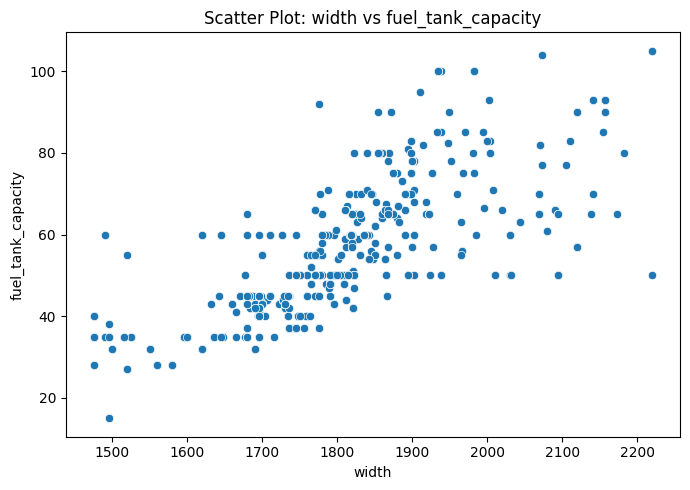

Plotting: width vs power_bhp


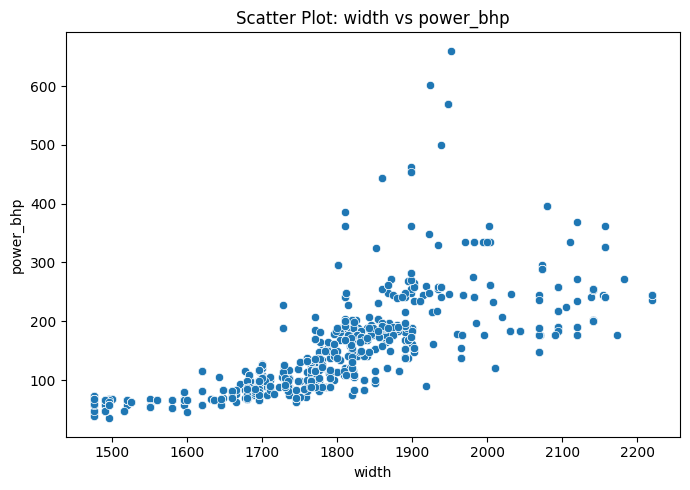

Plotting: width vs power_rpm


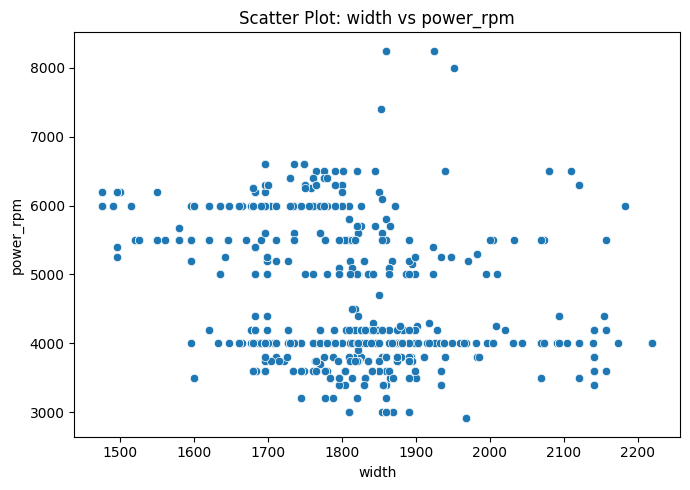

Plotting: width vs max_torque_nm


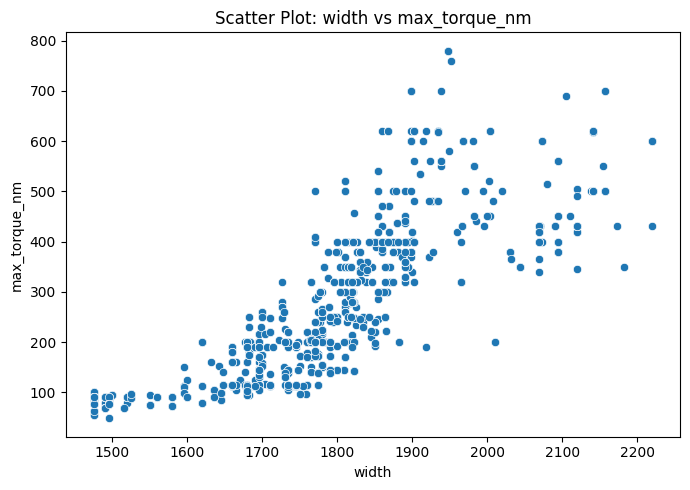

Plotting: width vs max_torque_rpm


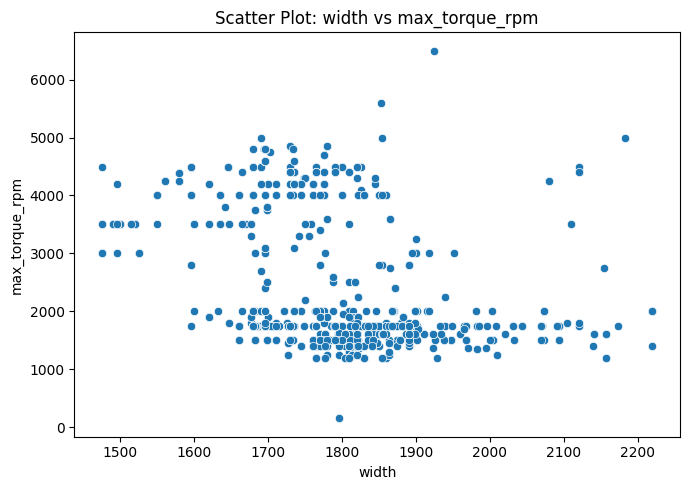

Plotting: height vs seating_capacity


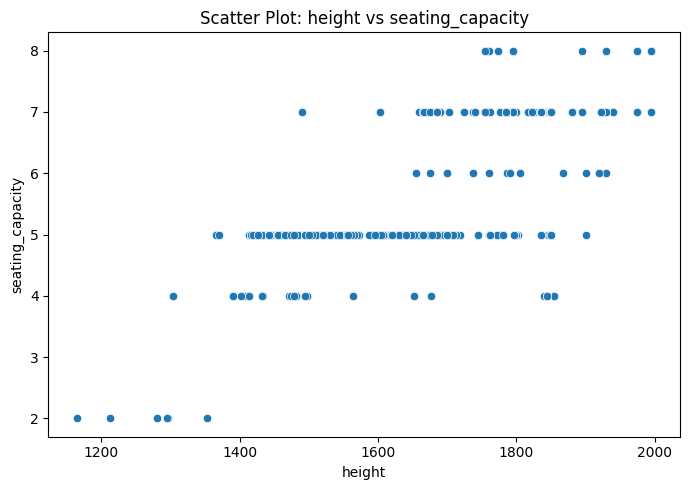

Plotting: height vs fuel_tank_capacity


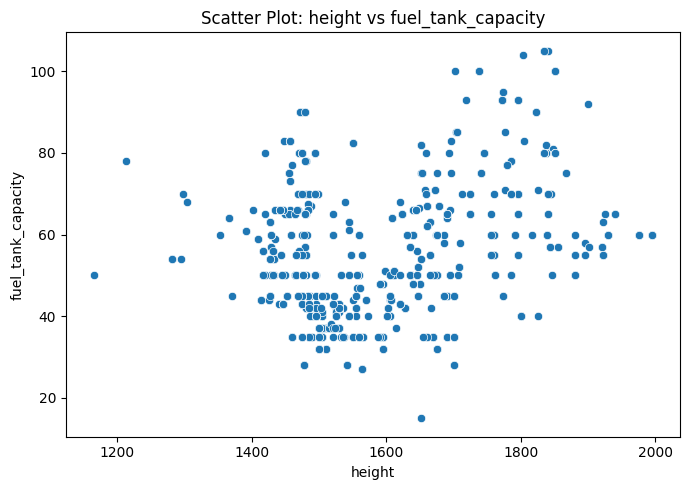

Plotting: height vs power_bhp


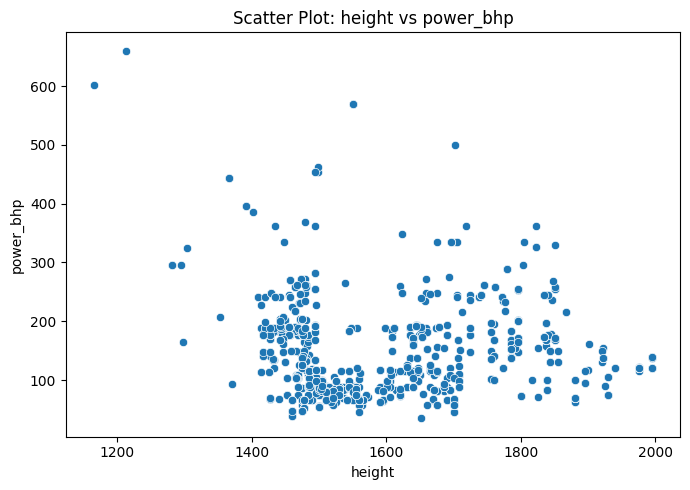

Plotting: height vs power_rpm


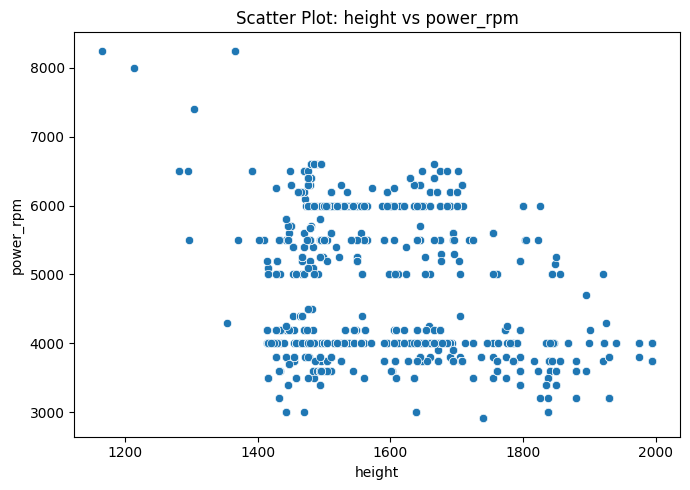

Plotting: height vs max_torque_nm


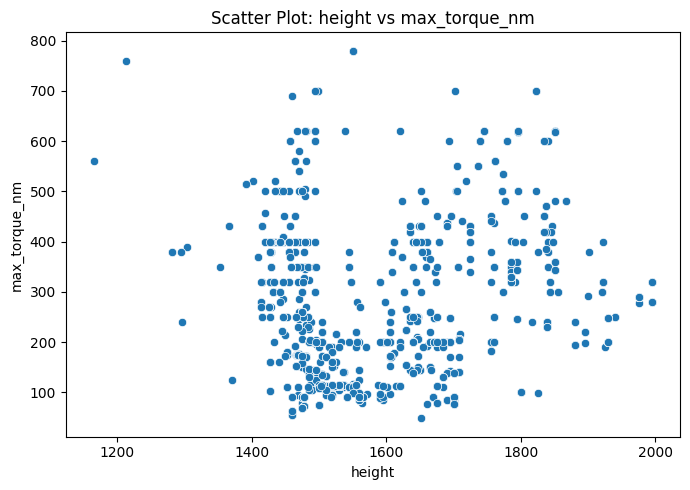

Plotting: height vs max_torque_rpm


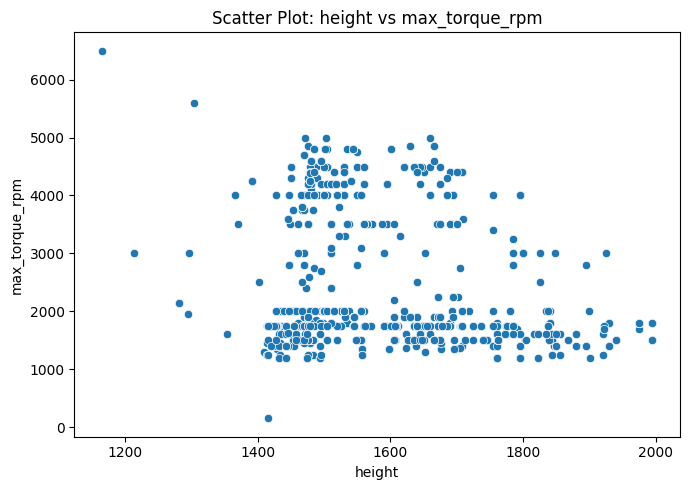

Plotting: seating_capacity vs fuel_tank_capacity


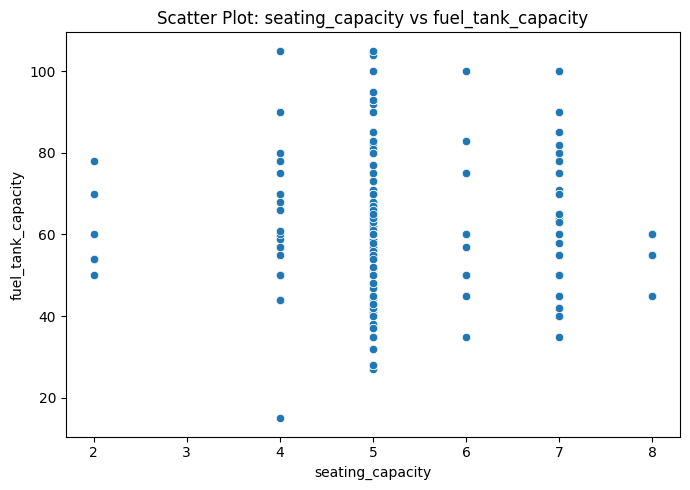

Plotting: seating_capacity vs power_bhp


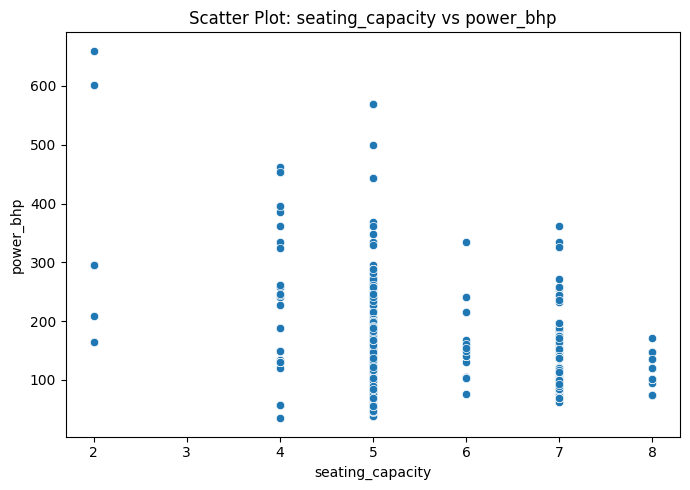

Plotting: seating_capacity vs power_rpm


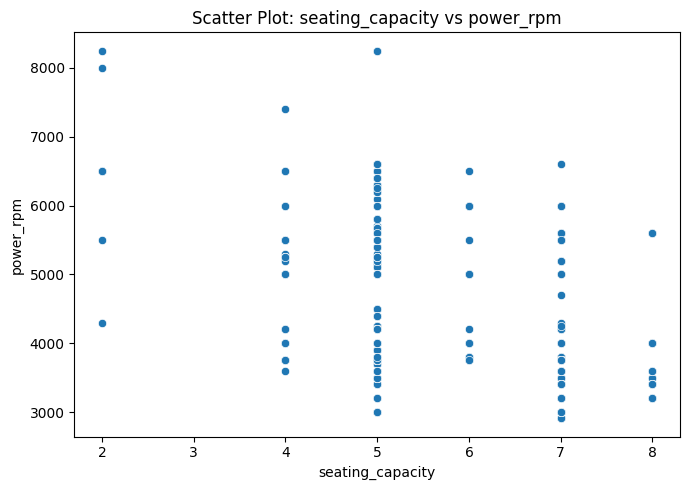

Plotting: seating_capacity vs max_torque_nm


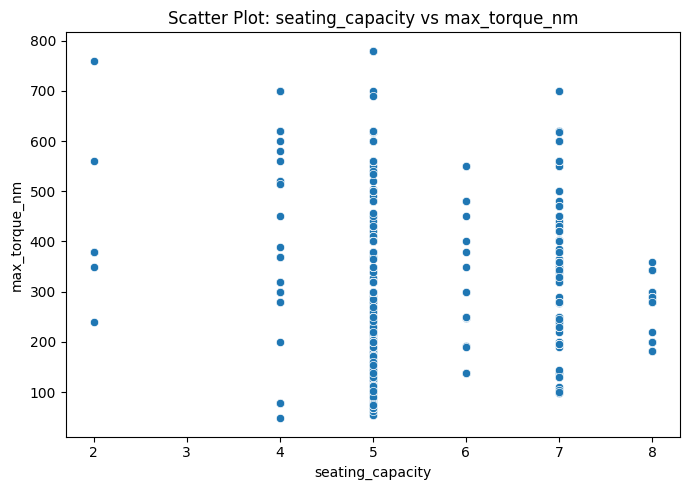

Plotting: seating_capacity vs max_torque_rpm


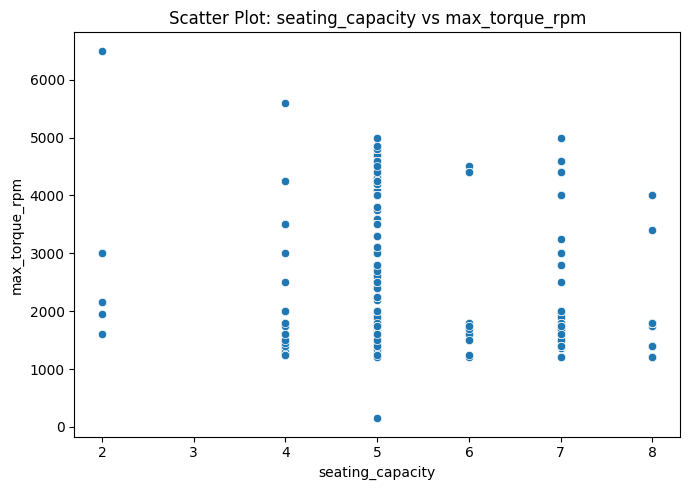

Plotting: fuel_tank_capacity vs power_bhp


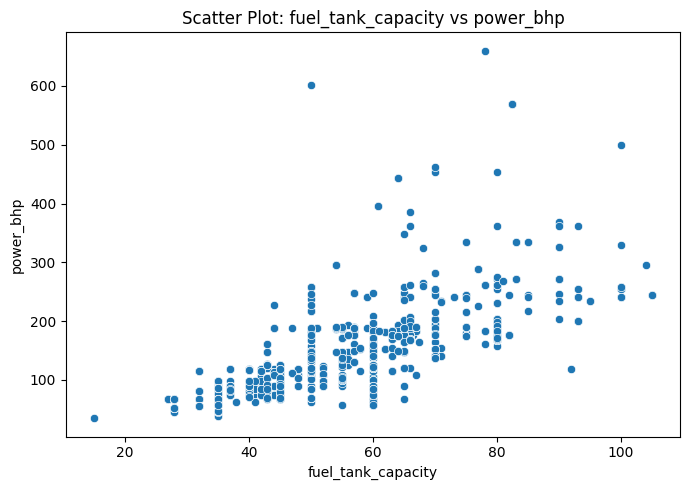

Plotting: fuel_tank_capacity vs power_rpm


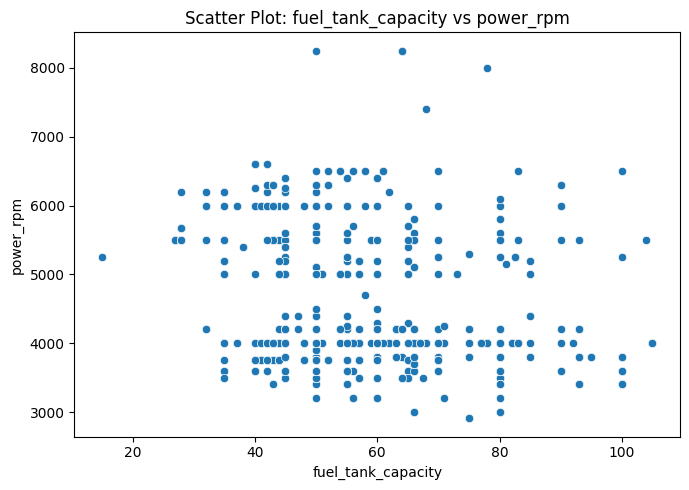

Plotting: fuel_tank_capacity vs max_torque_nm


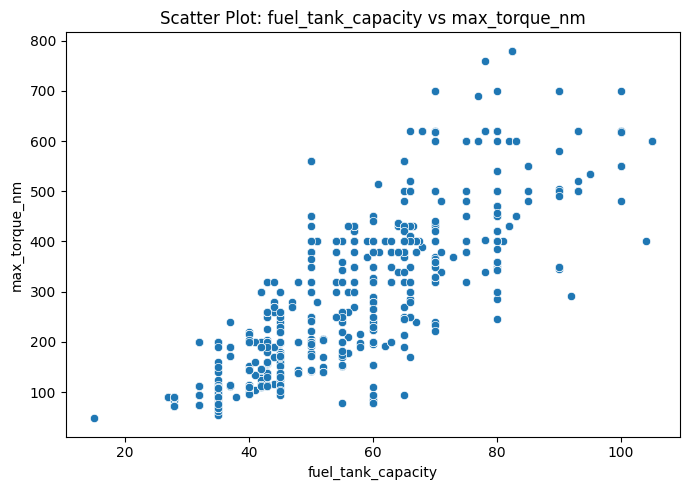

Plotting: fuel_tank_capacity vs max_torque_rpm


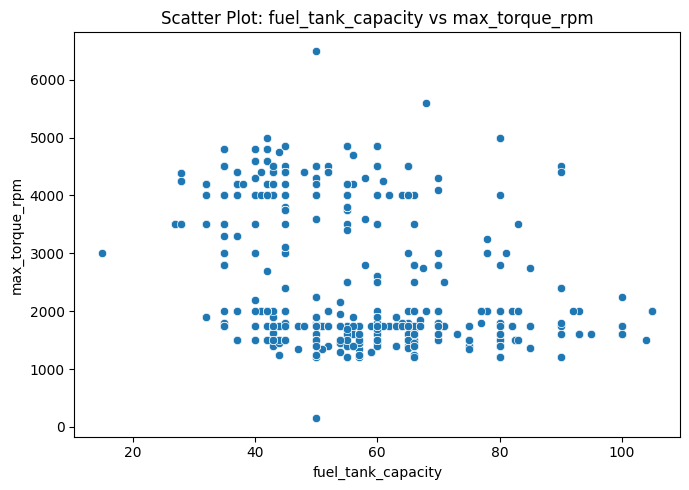

Plotting: power_bhp vs power_rpm


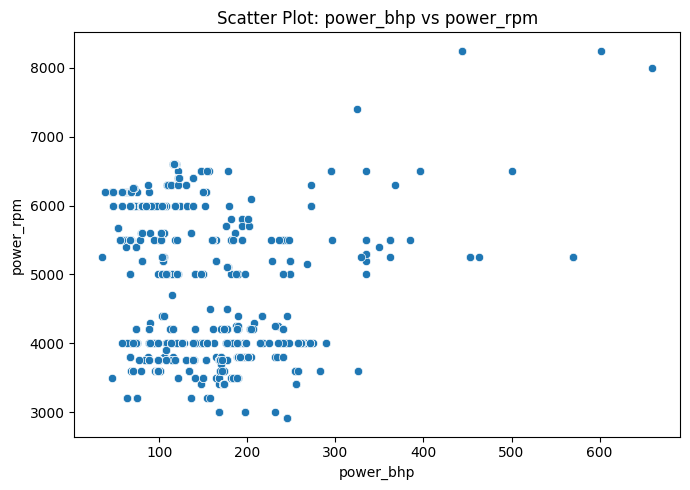

Plotting: power_bhp vs max_torque_nm


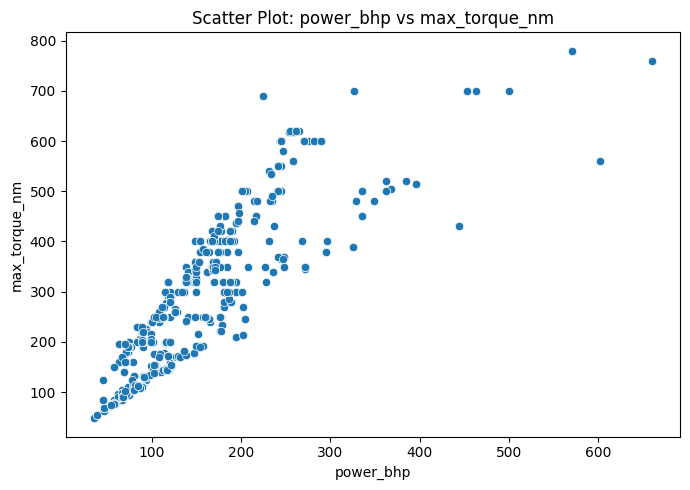

Plotting: power_bhp vs max_torque_rpm


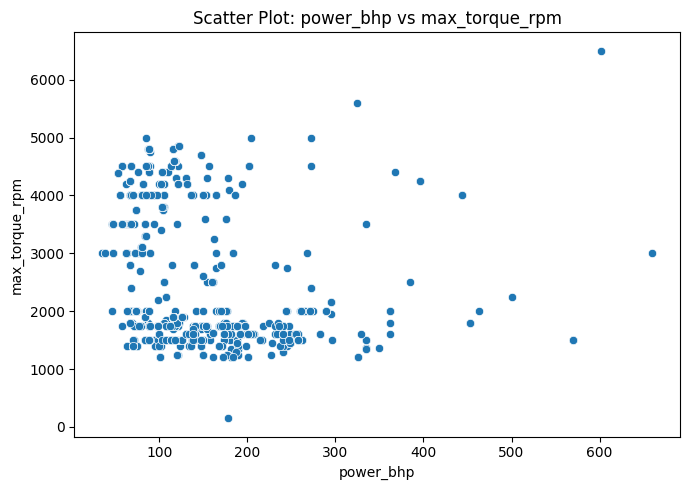

Plotting: power_rpm vs max_torque_nm


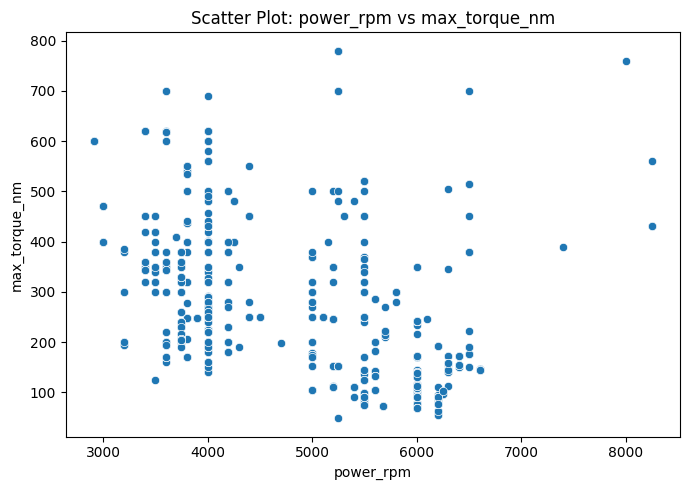

Plotting: power_rpm vs max_torque_rpm


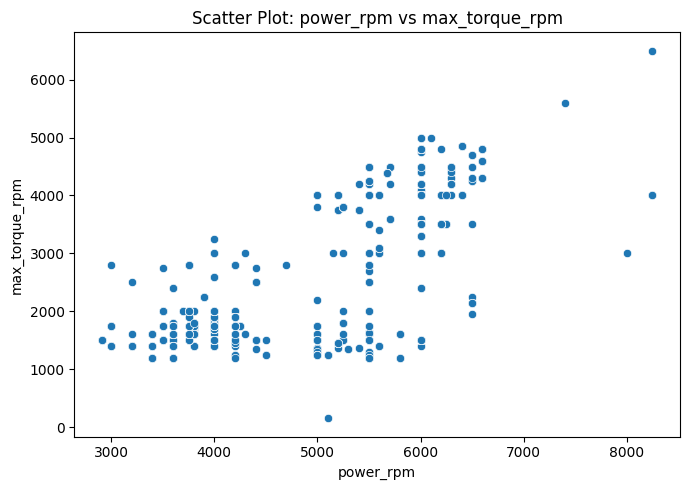

Plotting: max_torque_nm vs max_torque_rpm


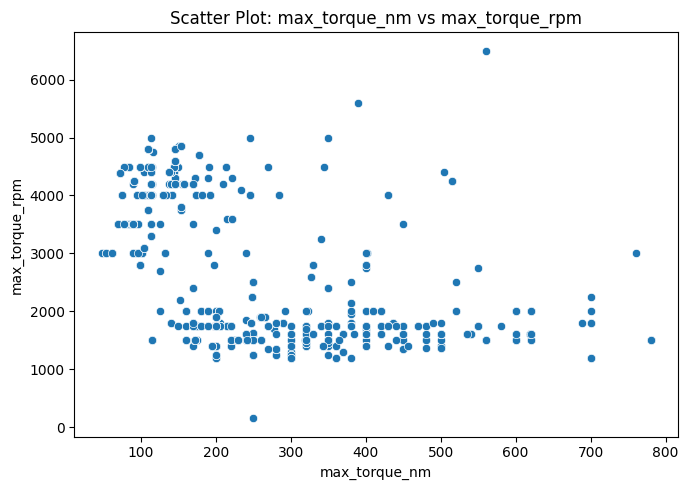

In [ ]:


num_cols = df.select_dtypes(include='number').columns


for i in range(len(num_cols)):
    for j in range(i + 1, len(num_cols)):
        col_x = num_cols[i]
        col_y = num_cols[j]

        print(f"Plotting: {col_x} vs {col_y}")


        plt.figure(figsize=(7, 5))  # wider plot
        sns.scatterplot(data=df, x=col_x, y=col_y)

        plt.title(f"Scatter Plot: {col_x} vs {col_y}")
        plt.xlabel(col_x)
        plt.ylabel(col_y)

        plt.tight_layout()
        plt.show()


In [ ]:
num_cols = df.select_dtypes(include='number').columns
correlation_matrix = df[num_cols].corr(method='pearson')
print(correlation_matrix)


                       price      year  kilometer    engine    length  \
price               1.000000  0.311400  -0.150825  0.611275  0.551212   
year                0.311400  1.000000  -0.296547  0.006105  0.085195   
kilometer          -0.150825 -0.296547   1.000000  0.060650  0.048478   
engine              0.611275  0.006105   0.060650  1.000000  0.792066   
length              0.551212  0.085195   0.048478  0.792066  1.000000   
width               0.559786  0.184518   0.017453  0.708772  0.806635   
height              0.076279  0.123845   0.091203  0.340742  0.182849   
seating_capacity   -0.036116  0.009271   0.122454  0.333359  0.292001   
fuel_tank_capacity  0.560842  0.065893   0.054438  0.773971  0.795220   
power_bhp           0.775919  0.114627  -0.032847  0.871493  0.789924   
power_rpm          -0.190992 -0.036035  -0.153739 -0.436329 -0.465031   
max_torque_nm       0.666652  0.109828   0.039265  0.857565  0.817882   
max_torque_rpm     -0.305911 -0.092247  -0.089218 -

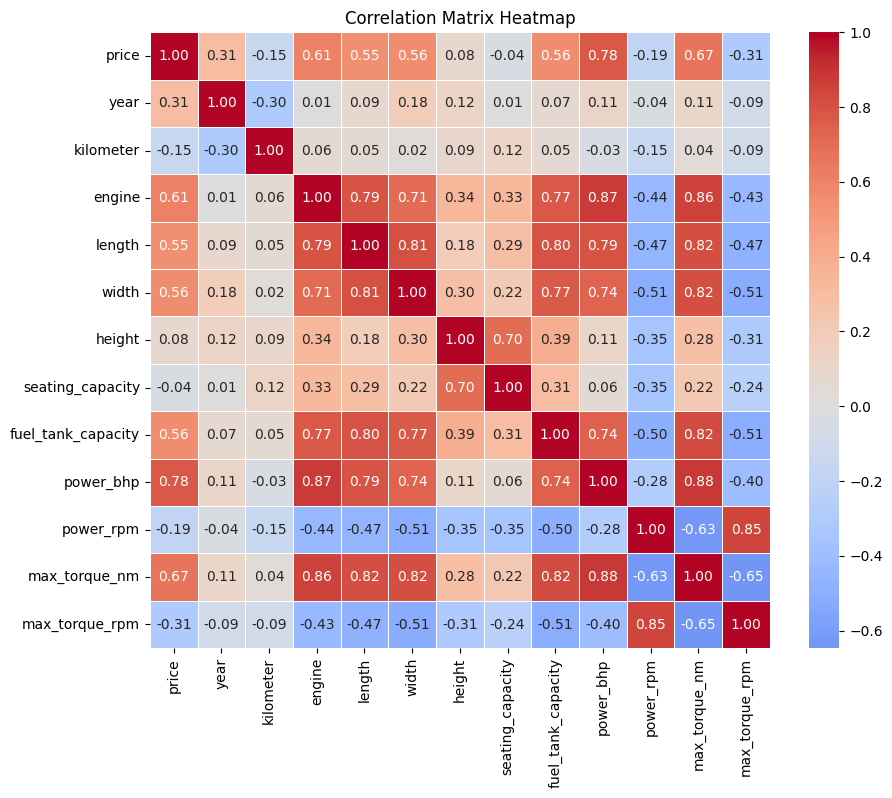

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5, fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
threshold = 0.8
corr_pairs = correlation_matrix.abs().unstack().sort_values(ascending=False)

# Filter pairs that are above threshold and not self-pairs
high_corr = corr_pairs[(corr_pairs < 1.0) & (corr_pairs > threshold)]

# 5. Display result
print("\n🔍 Highly correlated variable pairs (potential multicollinearity):")
if not high_corr.empty:
    print(high_corr)
else:
    print("✅ No strong correlations above the threshold.")


🔍 Highly correlated variable pairs (potential multicollinearity):
power_bhp           max_torque_nm         0.881982
max_torque_nm       power_bhp             0.881982
engine              power_bhp             0.871493
power_bhp           engine                0.871493
max_torque_nm       engine                0.857565
engine              max_torque_nm         0.857565
power_rpm           max_torque_rpm        0.845834
max_torque_rpm      power_rpm             0.845834
fuel_tank_capacity  max_torque_nm         0.823655
max_torque_nm       fuel_tank_capacity    0.823655
length              max_torque_nm         0.817882
max_torque_nm       length                0.817882
                    width                 0.816192
width               max_torque_nm         0.816192
length              width                 0.806635
width               length                0.806635
dtype: float64


In [ ]:
# export1_df['power_bhp'] =df['power_bhp']
# export1_df['price'] =df['price']
# print(export1_df)

**Categorical vs. Numerical:**

Grouped Statistics: Compare numerical summaries across different categories

In [ ]:

cat_cols = df.select_dtypes(include=['object', 'string[python]']).columns
num_cols = df.select_dtypes(include='number').columns

category_summaries = {}

for cat_col in cat_cols:
    print(f"\n--- Grouped Summary for Categorical Column: {cat_col} ---")

    summary = df.groupby(cat_col)[num_cols].describe()

    category_summaries[cat_col] = summary

    print(summary)



--- Grouped Summary for Categorical Column: make ---
               price                                                       \
               count          mean           std         min          25%   
make                                                                        
audi           127.0  2.703134e+06  1.603913e+06    745000.0   1550000.00   
bmw            121.0  3.768967e+06  2.011218e+06    750000.0   2299000.00   
chevrolet        7.0  3.412856e+05  1.130779e+05    190000.0    264499.50   
datsun           8.0  2.978750e+05  7.235120e+04    198000.0    247500.00   
ferrari          1.0  3.500000e+07           NaN  35000000.0  35000000.00   
fiat             2.0  3.050000e+05  9.899495e+04    235000.0    270000.00   
ford            48.0  1.474625e+06  1.867996e+06    145000.0    442499.75   
honda          158.0  6.221076e+05  2.998820e+05    100000.0    406250.00   
hyundai        349.0  7.232635e+05  4.392963e+05    120000.0    400000.00   
isuzu            2.0  

Box Plots: Compare distributions across categories.

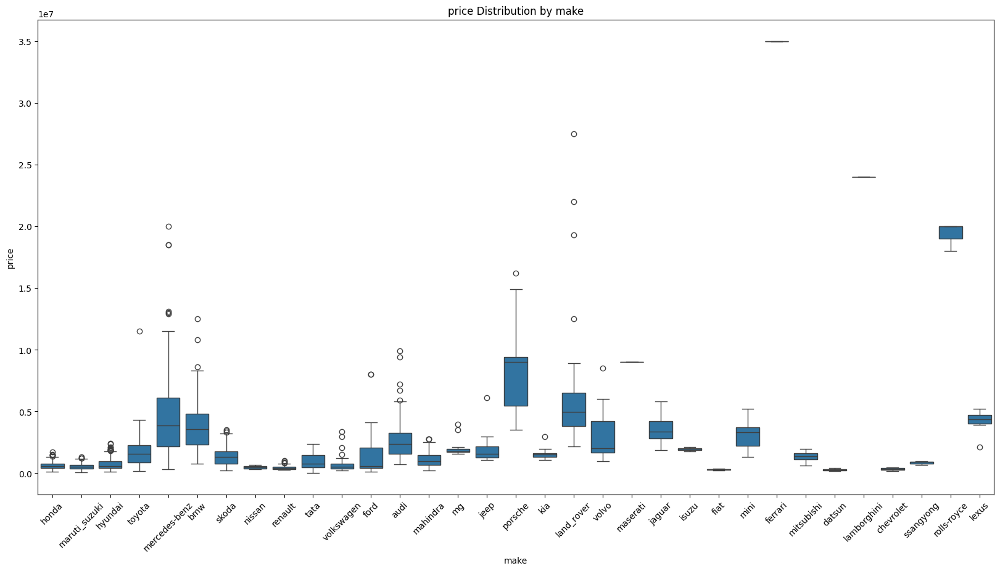

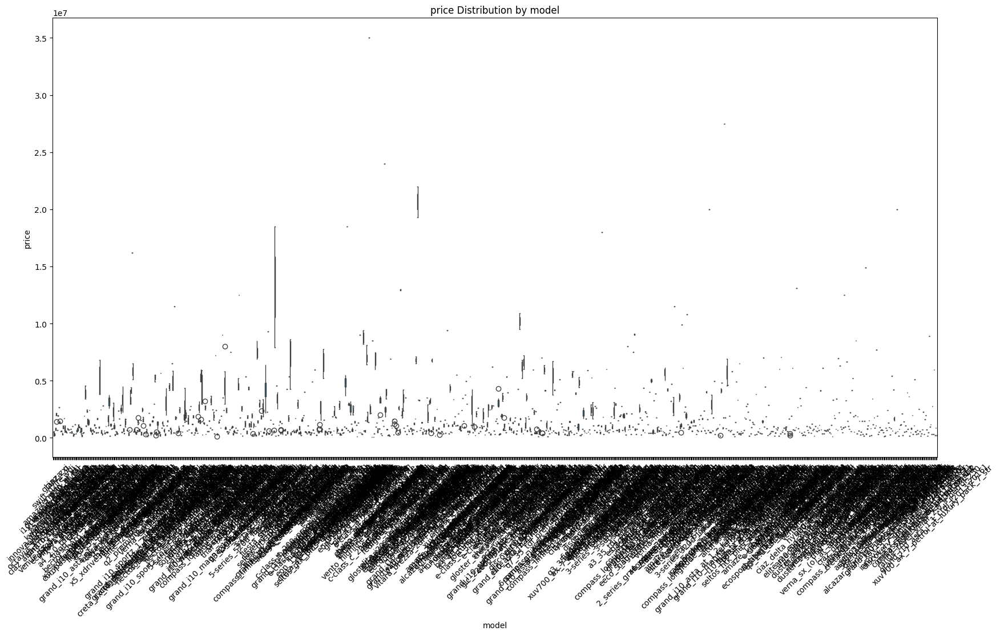

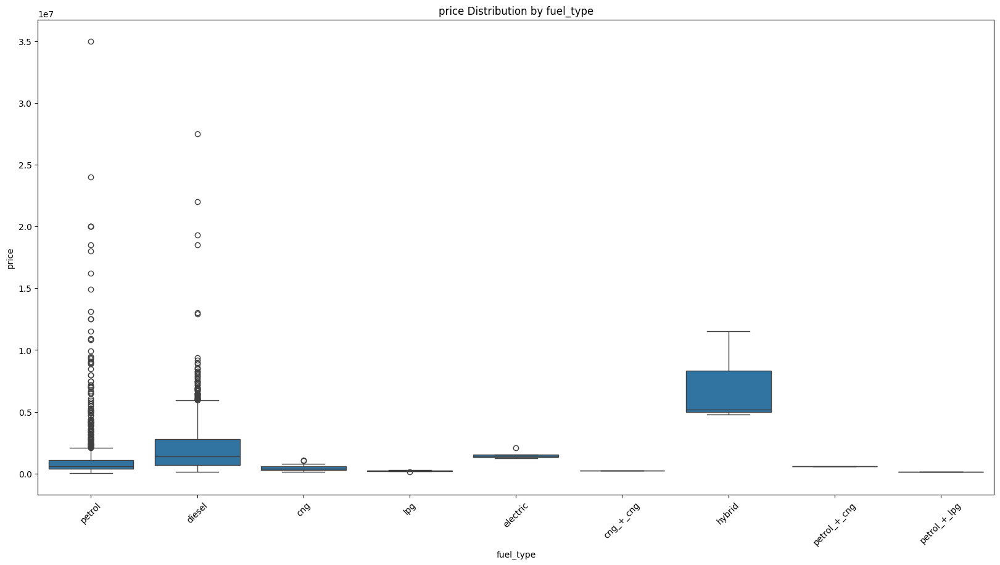

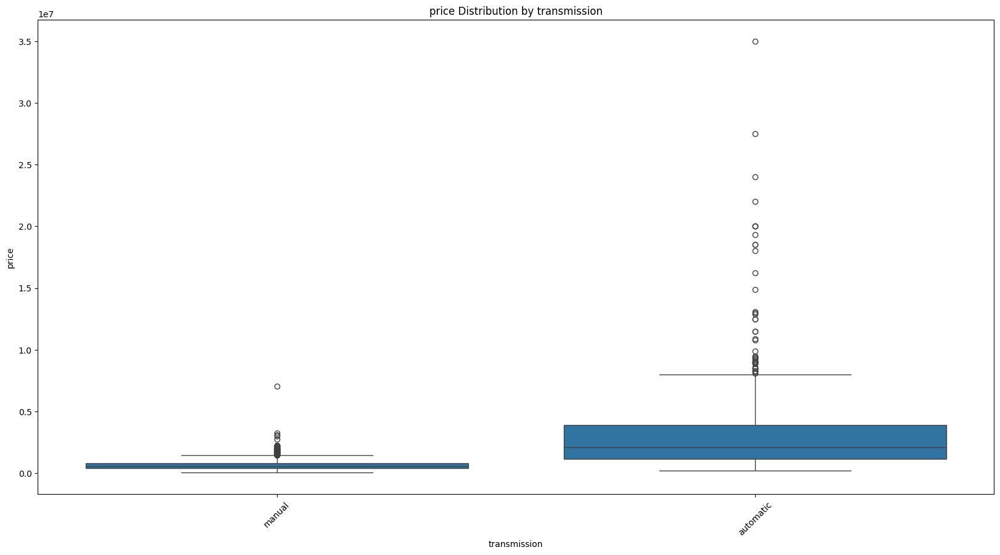

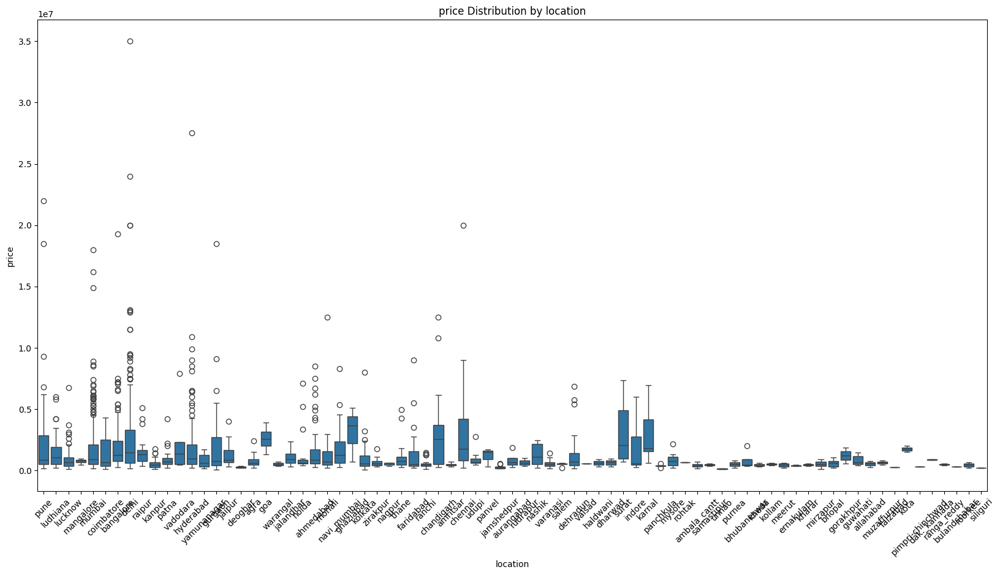

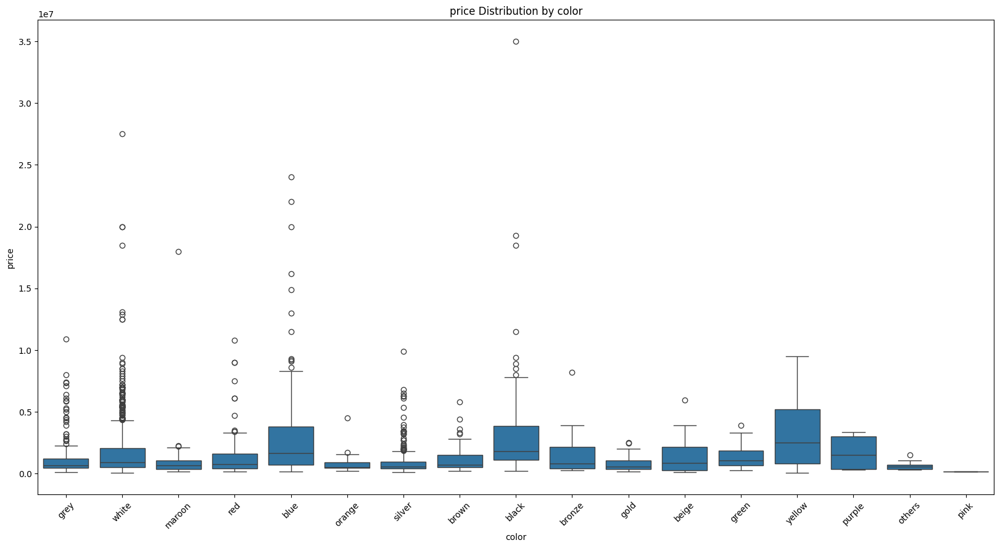

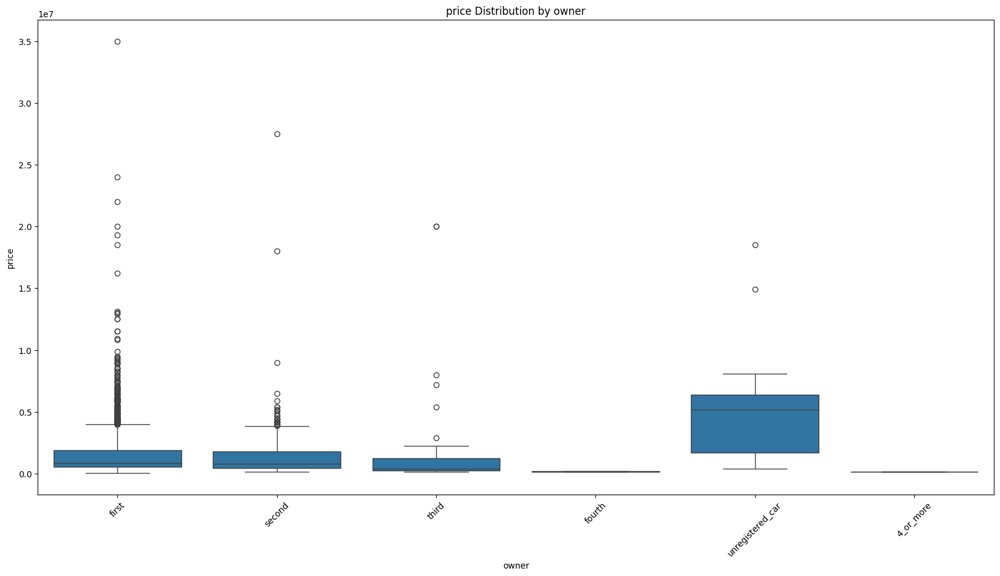

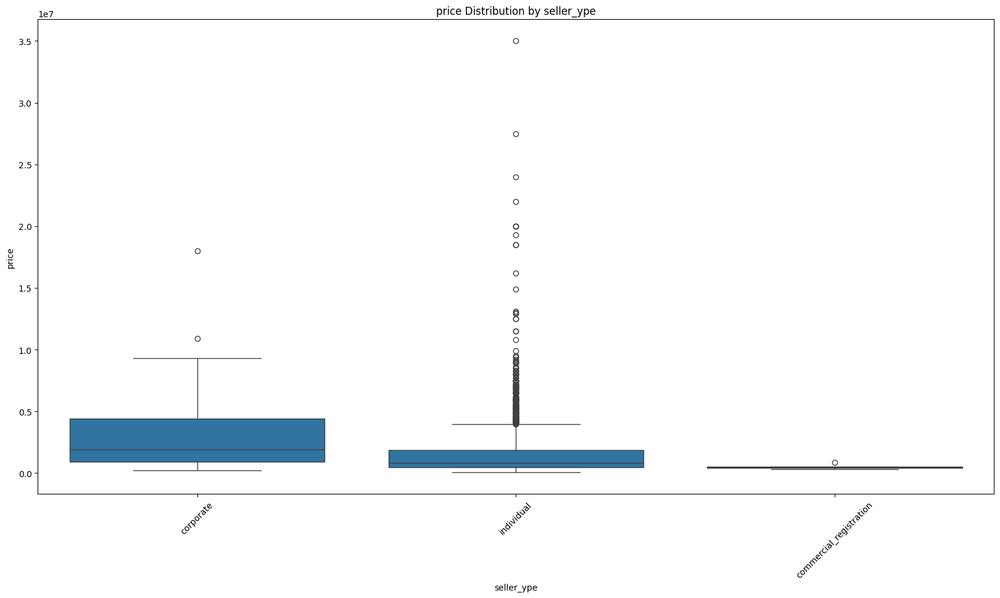

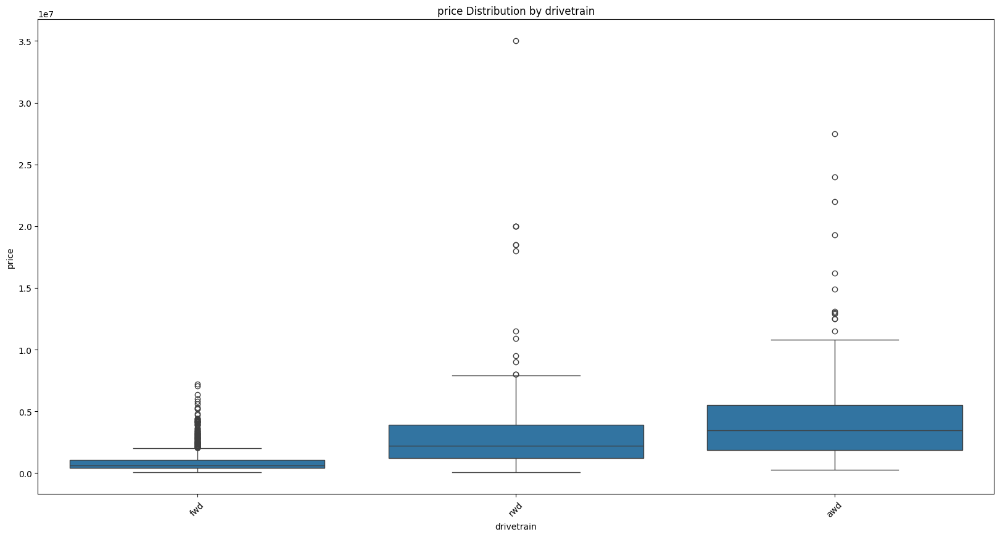

In [ ]:

cat_cols = df.select_dtypes(include=['object', 'string[python]']).columns
num_cols = df.select_dtypes(include='number').columns

for cat_col in cat_cols:
    for num_col in num_cols:
        plt.figure(figsize=(20, 10))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'{num_col} Distribution by {cat_col}')
        plt.xticks(rotation=45)

        plt.show()
        break #removing break will show the graph for all the numerical columns, for it is showing for first(price)


Violin Plots: Similar to box plots but also show density.

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


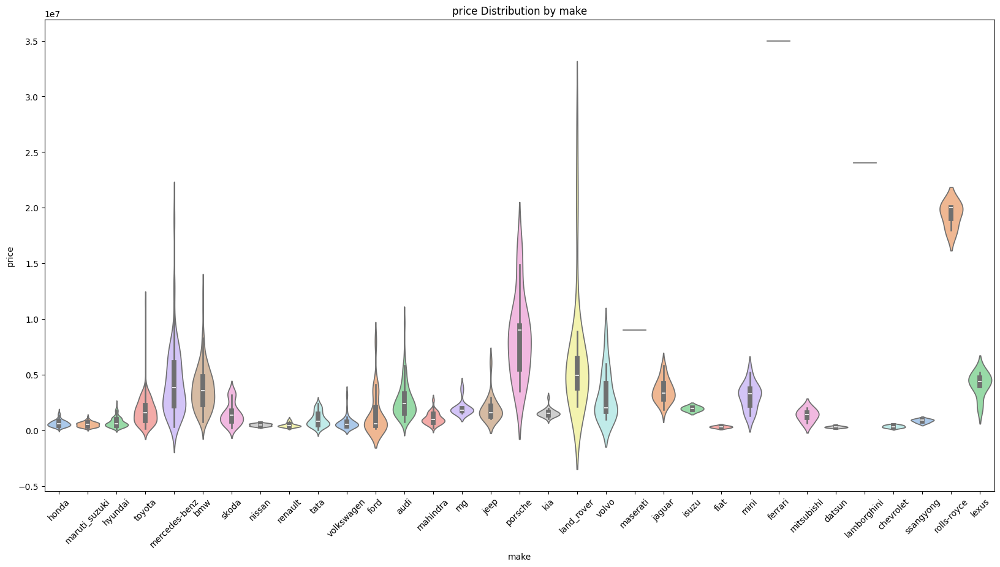

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


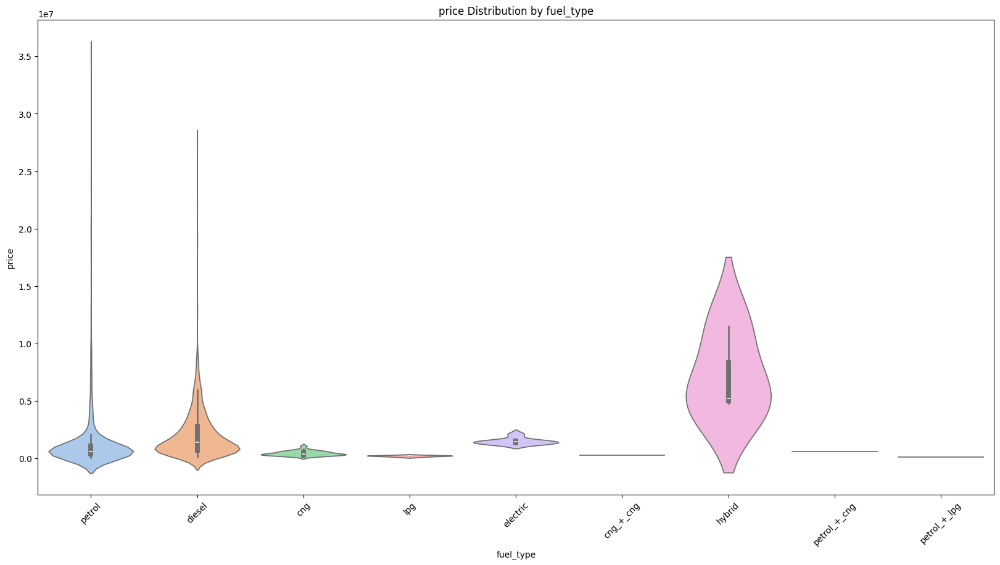

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


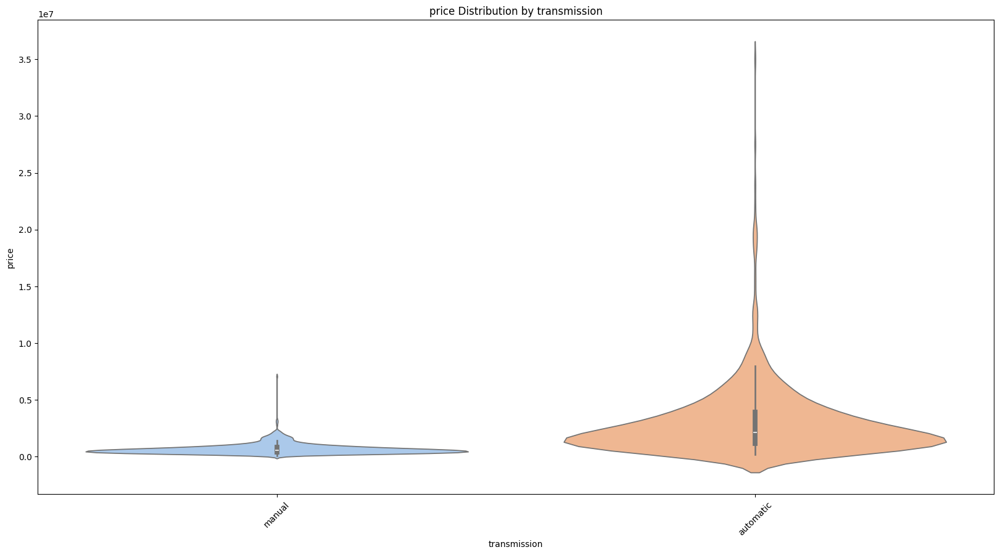

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


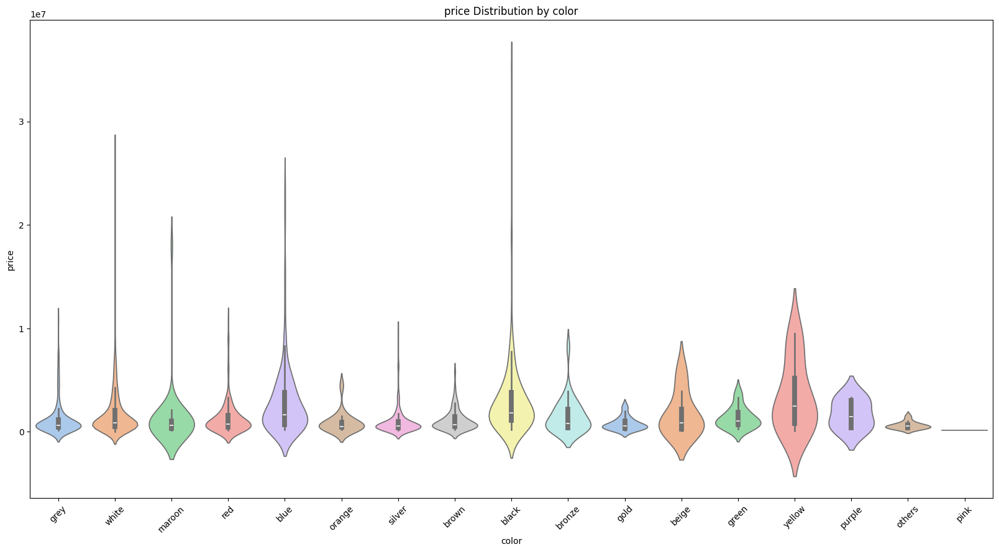

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


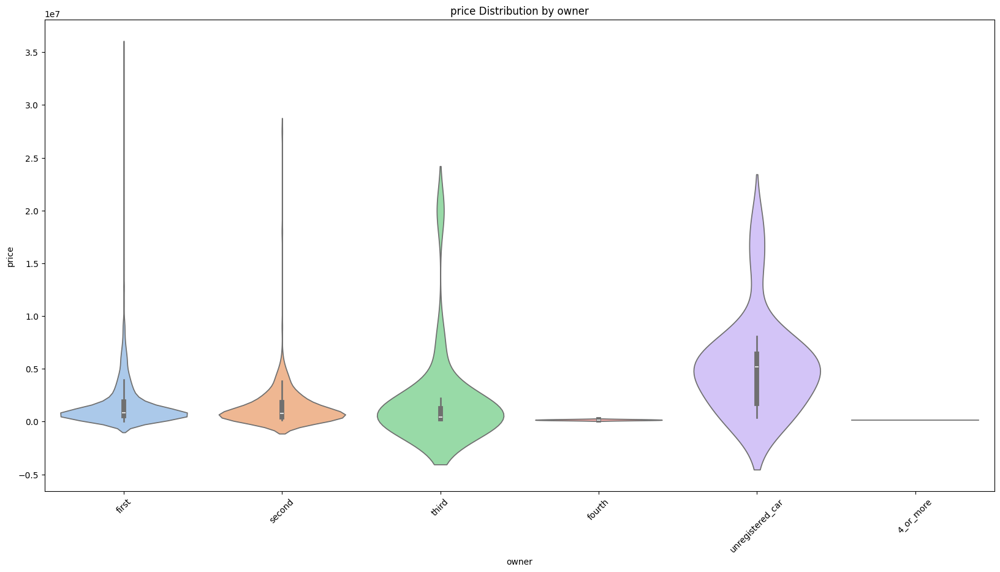

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


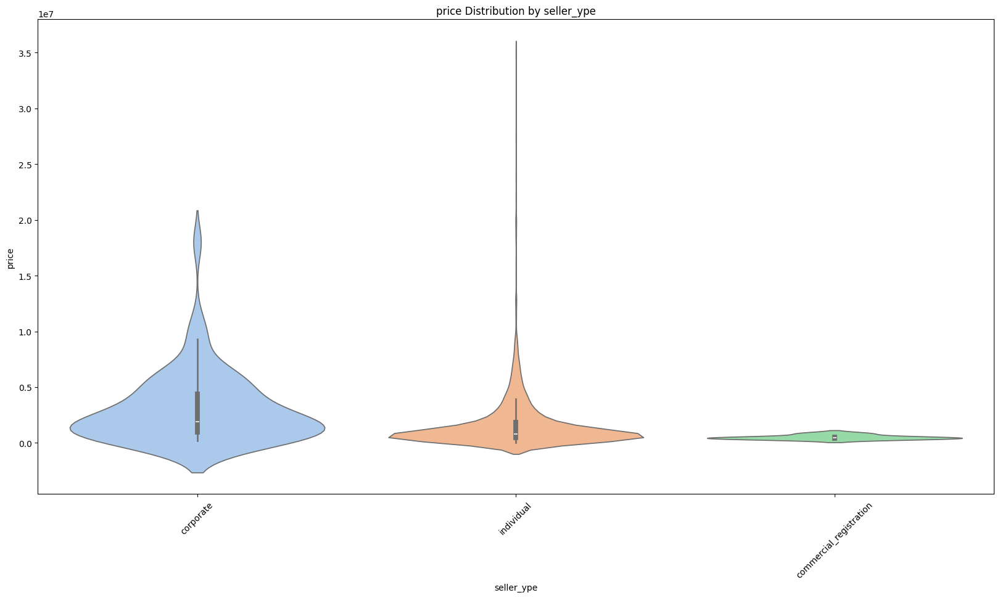

/tmp/ipython-input-2117849638.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')


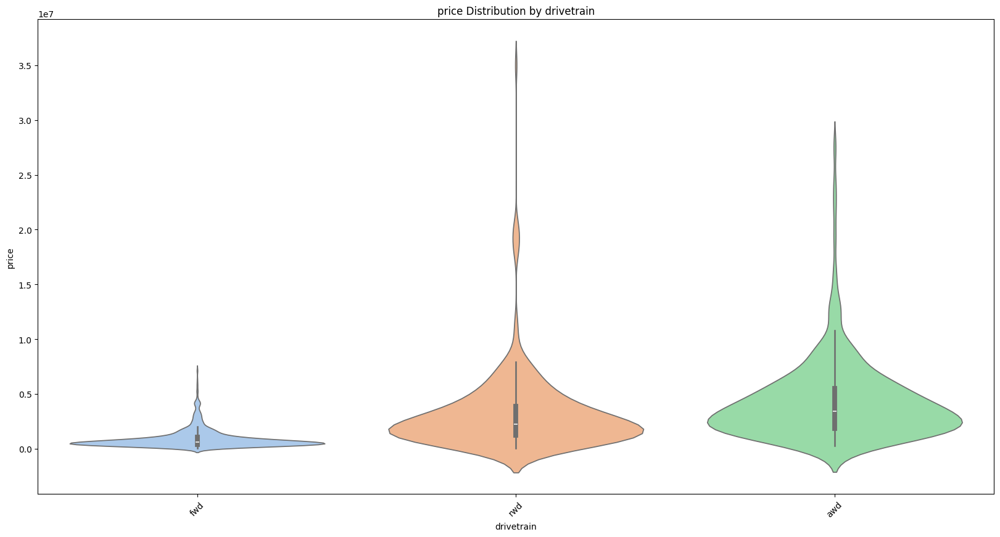

In [ ]:

for cat_col in cat_cols:
  if cat_col not in ['model','location']:
    for num_col in num_cols:
        plt.figure(figsize=(20, 10))
        sns.violinplot(data=df, x=cat_col, y=num_col, inner='box', palette='pastel')
        plt.title(f'{num_col} Distribution by {cat_col}')
        plt.xticks(rotation=45)

        plt.show()
        break #removing break will show the graph for all the numerical columns, for it is showing for first(price)








In [ ]:

cat_cols = df.select_dtypes(include=['string']).columns

category_dict = {col: df[col].dropna().unique().tolist() for col in cat_cols}

print(category_dict)


{'make': ['honda', 'maruti_suzuki', 'hyundai', 'toyota', 'mercedes-benz', 'bmw', 'skoda', 'nissan', 'renault', 'tata', 'volkswagen', 'ford', 'audi', 'mahindra', 'mg', 'jeep', 'porsche', 'kia', 'land_rover', 'volvo', 'maserati', 'jaguar', 'isuzu', 'fiat', 'mini', 'ferrari', 'mitsubishi', 'datsun', 'lamborghini', 'chevrolet', 'ssangyong', 'rolls-royce', 'lexus'], 'model': ['amaze_1.2_vx_i-vtec', 'swift_dzire_vdi', 'i10_magna_1.2_kappa2', 'glanza_g', 'innova_2.4_vx_7_str_[2016-2020]', 'ciaz_zxi', 'cla_200_petrol_sport', 'x1_xdrive20d_m_sport', 'octavia_1.8_tsi_style_plus_at_[2017]', 'terrano_xl_(d)', 'elite_i20_sportz_1.2', 'kwid_1.0_rxt_[2016-2019]', 'ciaz_alpha_hybrid_1.5_at_[2018-2020]', 'harrier_xz_[2019-2020]', 'polo_gt_tsi', 'celerio_zxi_amt_[2019-2020]', 'alto_800_lxi_(o)', 'baleno_alpha_automatic', 'wagon_r_zxi_1.2_amt', 'creta_1.6_e_petrol', 's-presso_vxi_amt', 'vento_comfortline_petrol_at', 'santro_sportz_amt_[2018-2020]', 'venue_sx_1.0_(o)_petrol_[2019-2020]', 'alto_lxi_cng', '

Bar Plots (showing aggregate).

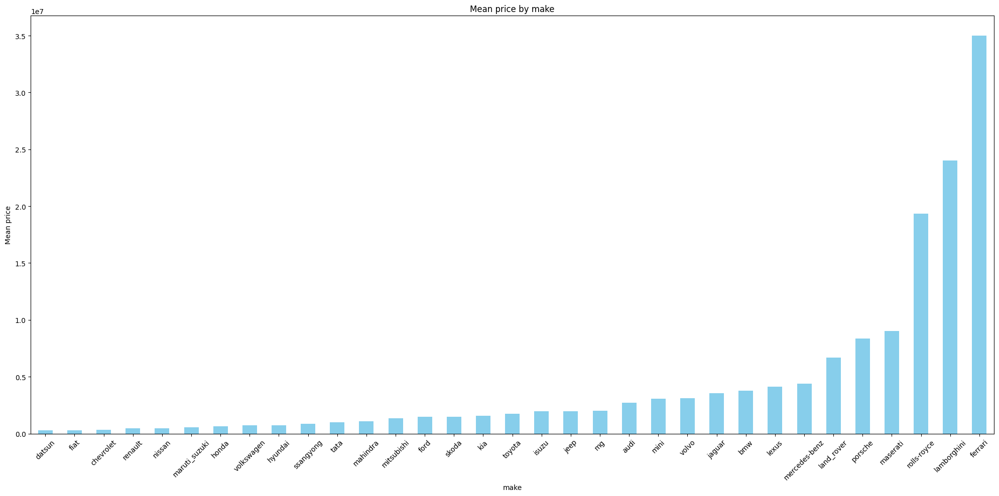

In [ ]:
for cat_col in cat_cols:
    for num_col in num_cols:
        # Aggregate: mean (you can change to 'sum', 'count', etc.)
        aggregated = df.groupby(cat_col)[num_col].mean().sort_values()

        plt.figure(figsize=(20, 10))
        aggregated.plot(kind='bar', color='skyblue')
        plt.title(f'Mean {num_col} by {cat_col}')
        plt.ylabel(f'Mean {num_col}')
        plt.xlabel(cat_col)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        break


In [ ]:
# Group models by make
make_model_df = df.groupby('make')['model'].unique().reset_index()

# Rename the column to 'model'
make_model_df.columns = ['make', 'model']

# Display the result
#print(make_model_df)


In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Get unique makes
unique_makes = df['make'].unique()

# Loop through makes
for make in unique_makes:
    make_df = df[df['make'] == make]

    for num_col in num_cols:
        # Aggregate numerical value (mean) per model
        model_summary = make_df.groupby('model')[num_col].mean().sort_values()

        # Plot
        plt.figure(figsize=(30, 8))
        sns.barplot(x=model_summary.index, y=model_summary.values, palette='crest')

        plt.title(f'{num_col} by Model for Make: {make}')
        plt.xlabel('model')
        plt.ylabel(f'Mean {num_col}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        break

*Categorical vs. Categorical:*
○​ Cross-Tabulation (Contingency Table): Show the frequency distribution of variable pairs.

In [ ]:

cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns

#cross-tabulations for each unique pair
for i in range(len(cat_cols)):
    for j in range(i + 1, len(cat_cols)):
        col1 = cat_cols[i]
        col2 = cat_cols[j]
        print(f"🔹 Plotting Crosstab Heatmap: {col1} vs {col2}")
        ctab = pd.crosstab(df[col1], df[col2])

        # 3. Plot heatmap
        plt.figure(figsize=(20, 10))
        sns.heatmap(ctab, annot=True, fmt='d', cmap='YlGnBu')
        plt.title(f'Heatmap of {col1} vs {col2}')
        plt.ylabel(col1)
        plt.xlabel(col2)
        plt.tight_layout()
        plt.show()
        break
        # print(f"\n🔹 Crosstab between '{col1}' and '{col2}':\n")
        # ctab = pd.crosstab(df[col1], df[col2])
        # print(ctab)
        # break


Stacked/Grouped Bar Charts: Visualize the relationship from the cross-tab

/tmp/ipython-input-233233482.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


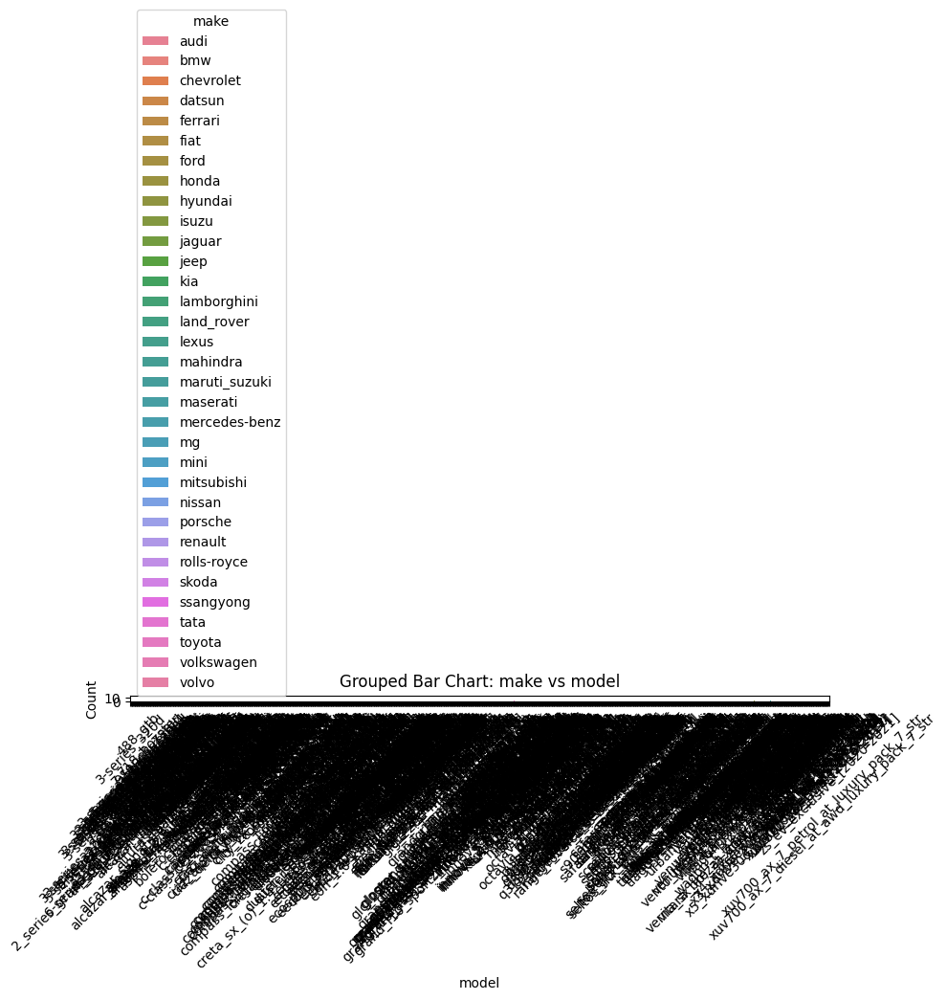

KeyboardInterrupt: 

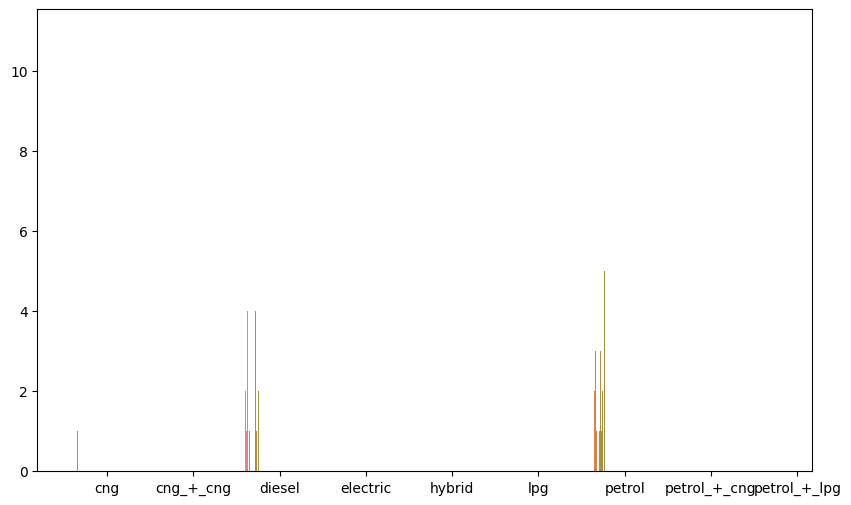

In [ ]:
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns


for i in range(len(cat_cols)):
    for j in range(i + 1, len(cat_cols)):
        col1 = cat_cols[i]
        col2 = cat_cols[j]

        ctab = pd.crosstab(df[col1], df[col2])


        df_melted = ctab.reset_index().melt(id_vars=col1, var_name=col2, value_name='Count')


        plt.figure(figsize=(10, 6))
        sns.barplot(data=df_melted, x=col2, y='Count', hue=col1)
        plt.title(f"Grouped Bar Chart: {col1} vs {col2}")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        break



**Multivariate Visualization:**
○​ Pair Plots: Create scatter plots for all pairs of numerical variables, with histograms/KDEs

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[0] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[1] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[2] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[3] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
print(df.columns)

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[4] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[5] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
# make                  string[python]0
# model                 string[python]1
# price                          int64
# year                           int64
# kilometer                      int64
# fuel_type             string[python]5
# transmission          string[python]6
# location              string[python]7
# color                 string[python]8
# owner                 string[python]9
# seller_ype            string[python]10
# engine                       float64
# drivetrain            string[python]12

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[6] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[7] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

In [ ]:
num_cols = df.select_dtypes(include='number').columns

# Optional: limit to top N numeric columns (e.g., based on variance)
top_num_cols = num_cols[:]  # Change this to select only top N if needed

# 2. Pick a categorical column for coloring (optional)
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
hue_col = cat_cols[8] if len(cat_cols) > 0 else None  # pick the first categorical column

# 3. Sample the data to avoid slow plotting (optional)
df_sampled = df[top_num_cols]
if hue_col:
    df_sampled[hue_col] = df[hue_col]

# 4. Plot
sns.pairplot(df_sampled, hue=hue_col, diag_kind='kde', corner=True)
plt.suptitle("Pair Plot of Selected Numerical Features", y=1.02)
plt.show()

*○​ Faceting: Create grids of plots based on categories.*

In [ ]:
cat_cols = df.select_dtypes(include=['object', 'category', 'string']).columns
num_cols = df.select_dtypes(include='number').columns

# 2. Loop over all combinations
for cat in cat_cols:
    for num in num_cols:
        # Limit to top N categories if needed (to avoid overcrowding)
        top_cats = df[cat].value_counts().index[:4]
        filtered_df = df[df[cat].isin(top_cats)]

        # 3. Create Facet plot (using hist/box/violin)
        g = sns.FacetGrid(filtered_df, col=cat, col_wrap=2, height=4, sharex=False)
        g.map(sns.histplot, num, bins=20, color='steelblue')

        plt.suptitle(f"Distribution of {num} by {cat}", y=1.05)
        plt.tight_layout()
        plt.show()

**6.​ Outlier Detection & Treatment (Deeper Dive):**

●​ Use visualizations (Box Plots, Scatter Plots) and statistical methods (Z-score, IQR) identified
earlier to confirm outliers.

visualization of categorical outliers

In [ ]:
#remove the values having lowest  count comapred to oher

In [ ]:
for col in cat_cols:
  plt.figure(figsize=(30, 10))
  sns.countplot(data=df, x=col, order=df[col].value_counts().index)
  plt.xticks(rotation=45)
  plt.title(f'Category frequency in {col}')
  plt.show()

adding low frequecy to large f values

In [ ]:
sns.set(style="whitegrid")

# Grouping data to get average price by fuel type
avg_price = df.groupby('fuel_type')['price'].median().reset_index()

# Sort by price (optional)
avg_price = avg_price.sort_values(by='price', ascending=False)

# Create the bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x='fuel_type', y='price', data=avg_price, palette='muted')

# Add labels and title
plt.xlabel('Fuel Type')
plt.ylabel('Average Price')
plt.title('Average Price by Fuel Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Group by fuel type and get mean and median prices
price_stats = df.groupby('fuel_type')['price'].agg(['count', 'mean', 'median']).sort_values('mean')

print(price_stats)
plt.figure(figsize=(20,10))
sns.boxplot(data=df, x='fuel_type', y='price')


In [ ]:
df['fuel_type'] = df['fuel_type'].str.replace('cng_+_cng','cng') #same
#df['fuel_type'] = df['fuel_type'].str.replace('hybird','electric') #hyprid have high values than electric
df['fuel_type'] = df['fuel_type'].str.replace('petrol_+_cng','petrol') #same mean/median price
df['fuel_type'] = df['fuel_type'].str.replace('petrol_+_lpg','petrol') #petrol+lpg price

In [ ]:
df['fuel_type'] = df['fuel_type'].str.replace('hybrid','others') #petrol+lpg price
df['fuel_type'] = df['fuel_type'].str.replace('electric','others') #petrol+lpg price

In [ ]:
df['owner'] = df['owner'].str.replace('fourth','4_or_more')

In [ ]:
sns.set(style="whitegrid")

# Grouping data to get average price by fuel type
avg_price = df.groupby('fuel_type')['price'].median().reset_index()

# Sort by price (optional)
avg_price = avg_price.sort_values(by='price', ascending=False)

# Create the bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x='fuel_type', y='price', data=avg_price, palette='muted')

# Add labels and title
plt.xlabel('Fuel Type')
plt.ylabel('Average Price')
plt.title('Average Price by Fuel Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df['model'].value_counts().plot(kind='barh', figsize=(14, 300))
plt.xlabel('Frequency')
plt.title(f'Frequency of values in {col}')
plt.show()


In [ ]:
numeric_cols = df.select_dtypes(include='number')

for col in numeric_cols:
    plt.figure(figsize=(12, 4))
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot for {col}')
    plt.show()


In [ ]:
numeric_cols = df.select_dtypes(include='number').columns

for col in numeric_cols:
    plt.figure(figsize=(12, 12))
    plt.scatter(x=df[col], y=range(len(df)))
    plt.title(f'Box Plot for {col}')
    plt.show()





In [ ]:
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[col] < Q1 - 1.5 * IQR) | (df[col] > Q3 + 1.5 * IQR)]
    print(f'{col} - Outliers: {len(outliers)}')


In [ ]:

df_z = df[numeric_cols].apply(zscore)

# Threshold of 3 standard deviations
outliers = (np.abs(df_z) > 3)


print(outliers.sum())

**outlier removal**

In [ ]:
num_cols=df.select_dtypes(include=['number'])

In [ ]:
for col in num_cols.columns:
    print(f"{col} ==> {num_cols[col].skew():.2f}")

In [ ]:
df_logs= df.copy(deep=True)
for col in num_cols:
  if num_cols[col].skew()>1:
    df_logs[col] = np.log2(df[col])
#no less than 1.

In [ ]:
print(df_logs['seating_capacity'])

In [ ]:
for col in numeric_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[col] < Q1 - 1.5 * IQR) | (df[col] > Q3 + 1.5 * IQR)]
    print(f'{col} - Outliers: {len(outliers)}')


In [ ]:
df_logs_numeric= df_logs.select_dtypes(include=['number'])
for col in df_logs_numeric:
    Q1 = df_logs_numeric[col].quantile(0.25)
    Q3 = df_logs_numeric[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df_logs_numeric[(df_logs_numeric[col] < Q1 - 1.5 * IQR) | (df_logs_numeric[col] > Q3 + 1.5 * IQR)]
    print(f'{col} - Outliers: {len(outliers)}')


In [ ]:
did not deleted the outlier need to discuss about it

**Feature Engineering (Initial Ideas):**
●​ Based on insights, consider creating new features from existing ones:

In [ ]:
df_combine= df.copy(deep=True)

In [ ]:
print(df[df['power_bhp'] < 0].index)

In [ ]:
df_combine['power_efficiency'] = df_combine['power_bhp'] / (df_combine['power_rpm'] + 1)
df_combine['torque_efficiency'] = df['max_torque_nm'] / (df['max_torque_rpm'] + 1)
df_combine.drop('power_bhp',axis=1, inplace=True)
df_combine.drop('power_rpm',axis=1, inplace=True)
df_combine.drop('max_torque_nm',axis=1, inplace=True)
df_combine.drop('max_torque_rpm',axis=1, inplace=True)

In [ ]:
df_combine['vehicle_age'] = 2025 - df_combine['year']
df_combine['km_per_year'] = df_combine['kilometer'] / (df_combine['vehicle_age'] + 1)

In [ ]:
#negative values check
numeric_df = df_combine.select_dtypes(include=['number'])

negative_cols = numeric_df.columns[(numeric_df < 0).any()]
print("Columns with negative values:", list(negative_cols))

In [ ]:
comb_num_cols = df_combine.select_dtypes(include='number').columns

correlation_matrix_comb = df_combine[comb_num_cols].corr(method='pearson')

plt.figure(figsize=(11, 9))
sns.heatmap(correlation_matrix_comb, annot=True, cmap='coolwarm', center=0, linewidths=0.5, fmt=".2f")

plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5, fmt=".2f")
plt.title("Correlation Matrix Heatmap")
plt.show()

In [ ]:
df_out = df_combine.copy(deep=True)

removed due to low corellion with price

In [ ]:
df_out.drop('height', axis=1, inplace=True)
df_out.drop('seating_capacity', axis=1, inplace=True)
df_out.drop('kilometer', axis=1, inplace=True)
#df_out.drop('power_rpm', axis=1, inplace=True)
df_out.drop('km_per_year', axis=1, inplace=True)

removed due to high corelation between each other so one is kept

In [ ]:
#power_efficiency has high corelation with engine, length, width , fuel_tank_capacity torque_efficiency

In [ ]:
df_out.drop('engine', axis=1, inplace=True)
df_out.drop('length', axis=1, inplace=True)
df_out.drop('width', axis=1, inplace=True)
#df_out.drop('power_rpm', axis=1, inplace=True)
df_out.drop('fuel_tank_capacity', axis=1, inplace=True)
df_out.drop('torque_efficiency', axis=1, inplace=True)

In [ ]:
#vehicle age is same as year so drop vehicle_age
df_out.drop('vehicle_age', axis=1, inplace=True)

In [ ]:
out_num_cols=df_out.select_dtypes(include=['number'])

In [ ]:
for col in out_num_cols:
    Q1 = df_out[col].quantile(0.25)
    Q3 = df_out[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df_out[(df_out[col] < Q1 - 1.5 * IQR) | (df_out[col] > Q3 + 1.5 * IQR)]
    #if(col=='year'):
    #  print(outliers)
    print(f'{col} - Outliers: {len(outliers)}')


In [ ]:
df_out.to_csv('cleaned_data.csv', index=False)

In [ ]:
print(df_out.columns)